# Simulation using Concord

In [1]:
%load_ext autoreload
%autoreload 2

In [ ]:
import numpy as np
import scanpy as sc
import time
from pathlib import Path
import torch
import Concord as ccd
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline



In [3]:
proj_name = "simulation_4cluster"
save_dir = f"../save/dev_{proj_name}-{time.strftime('%b%d')}/"
save_dir = Path(save_dir)
save_dir.mkdir(parents=True, exist_ok=True)

data_dir = f"../data/{proj_name}/"
data_dir = Path(data_dir)
data_dir.mkdir(parents=True, exist_ok=True)
device = torch.device('cuda:3' if torch.cuda.is_available() else 'cpu')
print(device)
seed = 0
ccd.ul.set_seed(seed)

file_suffix = f"{time.strftime('%b%d-%H%M')}"
file_suffix

cuda:3


'Nov13-1331'

In [4]:
state_key = 'cluster'
batch_key = 'batch'
state_type = 'cluster'
batch_type = 'batch_specific_features'
distribution = 'normal'

In [146]:
from Concord.utils.simulation import Simulation

# Create an instance of the Simulation class

n_cells = [200,30,100,50]
n_genes = [100,30,60,100]

sim = Simulation(n_cells=n_cells, n_genes=n_genes,
                 n_batches=1, n_states=4, 
                 state_type=state_type, 
                 state_distribution = distribution, 
                 state_level=5, 
                 state_min_level=0,
                 state_dispersion=[3.0, 3.0, 2.0, 1.0],
                 program_structure="uniform",
                 program_on_time_fraction=0.3,
                 trajectory_program_num=4,
                 trajectory_loop_to=[1],
                 batch_feature_frac=0.0,
                 batch_distribution = distribution,
                 batch_type=batch_type, 
                 batch_level=[5,5], 
                 batch_dispersion=[3.0, 3.0], 
                 pairwise_non_specific_gene_fraction={(0,1):0.7, (0,2):0.0, (0,3):0.0, (1,2):0.0, (1,3):0.0, (2,3):0.0},
                 global_non_specific_gene_fraction=0.2,
                 non_neg=True, to_int=True,
                 seed=seed)

# Generate the simulated data
adata, adata_state = sim.simulate_data()
adata.layers['counts'] = adata.X.copy()

Concord.utils.simulation - INFO - Simulating 4 clusters with distribution: normal with mean expression 5 and dispersion [3.0, 3.0, 2.0, 1.0].
Concord.utils.simulation - INFO - Adding non-specific genes to the expression matrix. Note this will increase gene count compared to the specified value.
Concord.utils.simulation - INFO - Adding non-specific genes to the expression matrix. Note this will increase gene count compared to the specified value.
Concord.utils.simulation - INFO - Simulating batch-specific features effect on batch_1 by appending a set of batch-specific genes with normal distributed value with level 5 and dispersion 3.0.


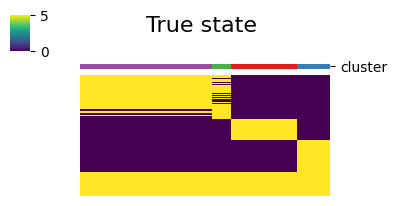

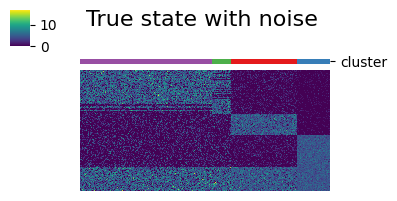

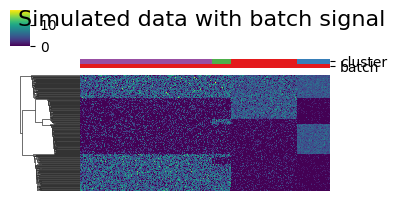

In [147]:
ccd.pl.heatmap_with_annotations(adata_state, val='no_noise', obs_keys=[state_key], yticklabels=False, cluster_cols=False, cluster_rows=False, value_annot=False, cmap='viridis', title='True state', save_path=save_dir/f'true_state_heatmap_{file_suffix}.png', figsize=(4, 2), dpi=300)
ccd.pl.heatmap_with_annotations(adata_state, val='wt_noise', obs_keys=[state_key], yticklabels=False, cluster_cols=False, cluster_rows=False, value_annot=False, cmap='viridis', title='True state with noise', save_path=save_dir/f'true_state_with_noise_heatmap_{file_suffix}.png', figsize=(4, 2), dpi=300)
ccd.pl.heatmap_with_annotations(adata, val='X', obs_keys=[state_key, batch_key], yticklabels=False, cluster_cols=False, cluster_rows=True, value_annot=False, cmap='viridis', title='Simulated data with batch signal', save_path=save_dir/f'simulated_data_heatmap_{file_suffix}.png', figsize=(4, 2), dpi=300)

### No batch effect, no noise

In [148]:
ccd.ul.run_pca(adata_state, source_key='no_noise', result_key='PCA_no_noise', n_pc=30, random_state=seed)
ccd.ul.run_umap(adata_state, source_key='PCA_no_noise', result_key='UMAP_no_noise', random_state=seed)

Concord - INFO - PCA performed on source data with 30 components
Concord - INFO - PCA embedding stored in adata.obsm['PCA_no_noise']
Concord - INFO - UMAP embedding stored in adata.obsm['UMAP_no_noise']


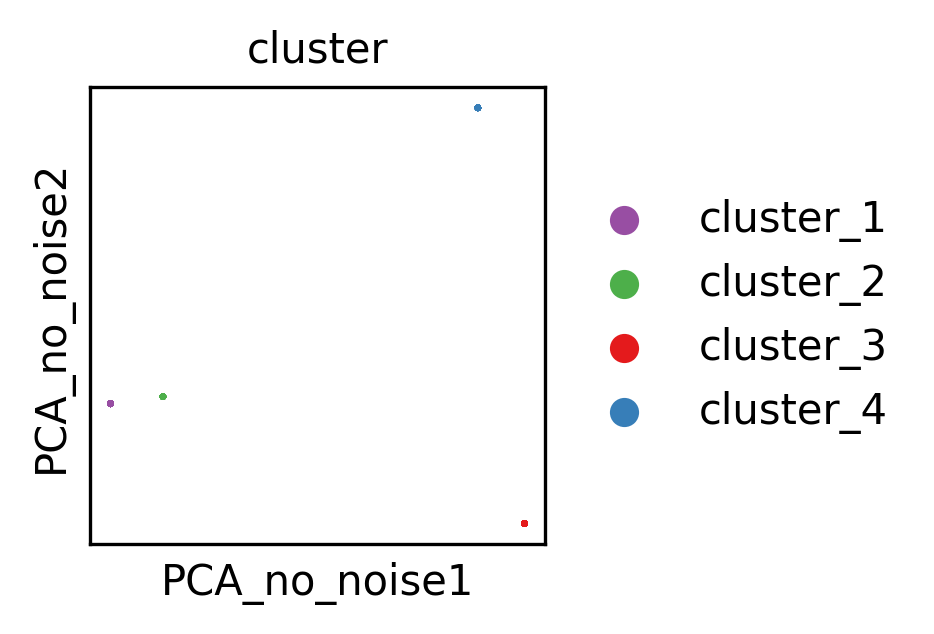

In [149]:
show_basis = 'PCA_no_noise'
show_cols = [state_key]

ccd.pl.plot_embedding(
    adata_state, show_basis, show_cols, figsize=(3,2), dpi=300, ncols=1, font_size=10, point_size=10, legend_loc='right margin',
    save_path=save_dir / f"nobatch_{show_basis}_{file_suffix}.pdf"
)

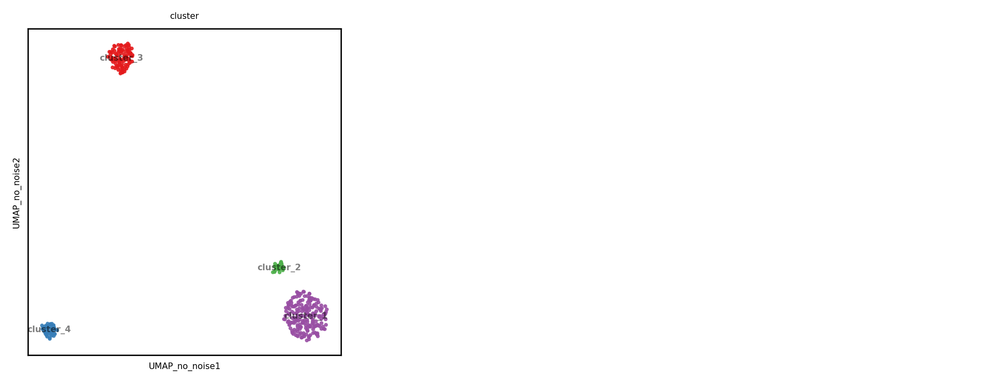

In [111]:
show_basis = 'UMAP_no_noise'
show_cols = [state_key]

ccd.pl.plot_embedding(
    adata_state, show_basis, show_cols, figsize=(8,3), dpi=300, ncols=3, font_size=5, point_size=20, legend_loc='on data',
    save_path=save_dir / f"nobatch_{show_basis}_{file_suffix}.png"
)

### NO batch effect, noise added, PCA and UMAP

In [150]:
adata_state.X = adata_state.layers['wt_noise'].copy()
ccd.ul.run_pca(adata_state, source_key='wt_noise', result_key='PCA_wt_noise', n_pc=30, random_state=seed)
ccd.ul.run_umap(adata_state, source_key='PCA_wt_noise', result_key='UMAP_wt_noise', random_state=seed)

Concord - INFO - PCA performed on source data with 30 components
Concord - INFO - PCA embedding stored in adata.obsm['PCA_wt_noise']
Concord - INFO - UMAP embedding stored in adata.obsm['UMAP_wt_noise']


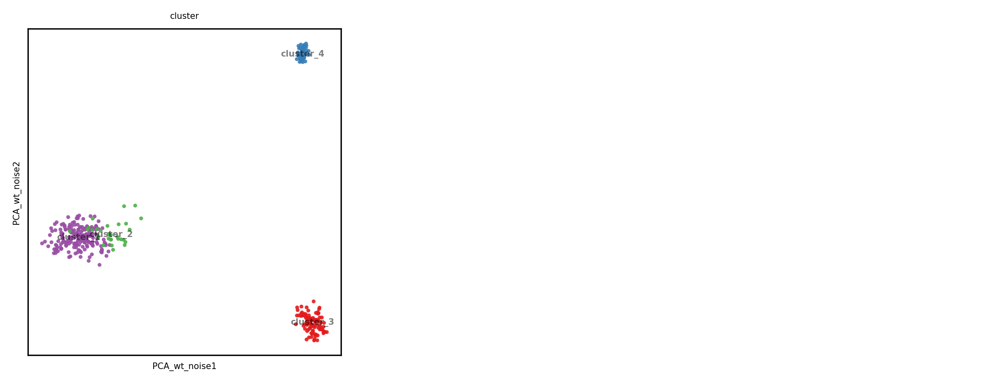

In [151]:
show_basis = 'PCA_wt_noise'
show_cols = [state_key]

ccd.pl.plot_embedding(
    adata_state, show_basis, show_cols, figsize=(8,3), dpi=300, ncols=3, font_size=5, point_size=20, legend_loc='on data',
    save_path=save_dir / f"nobatch_{show_basis}_{file_suffix}.png"
)

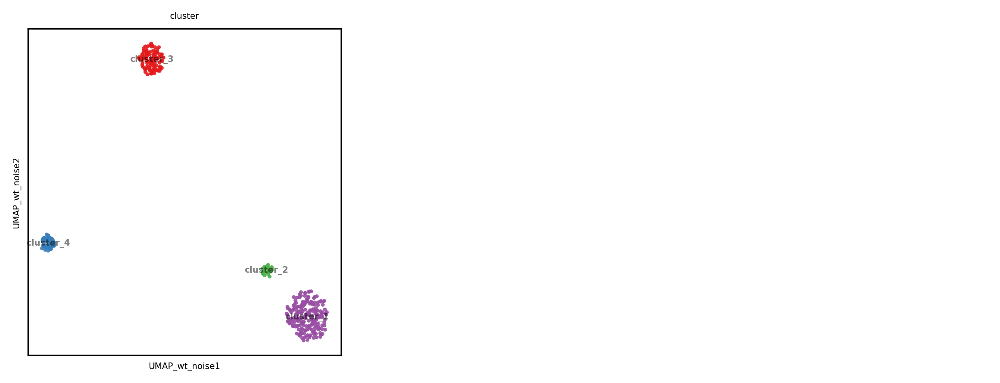

In [51]:
show_basis = 'UMAP_wt_noise'
show_cols = [state_key]

ccd.pl.plot_embedding(
    adata_state, show_basis, show_cols, figsize=(8,3), dpi=300, ncols=3, font_size=5, point_size=20, legend_loc='on data',
    save_path=save_dir / f"nobatch_{show_basis}_{file_suffix}.png"
)

### No batch correction, PCA and UMAP

In [ ]:

n_pcs = min(adata.n_obs, adata.n_vars)-1
sc.pp.pca(adata, n_comps=n_pcs)
sc.pp.neighbors(adata, n_neighbors=30, n_pcs=n_pcs)
sc.tl.umap(adata, min_dist=0.5)
adata.obsm["Unintegrated"] = adata.obsm["X_pca"]

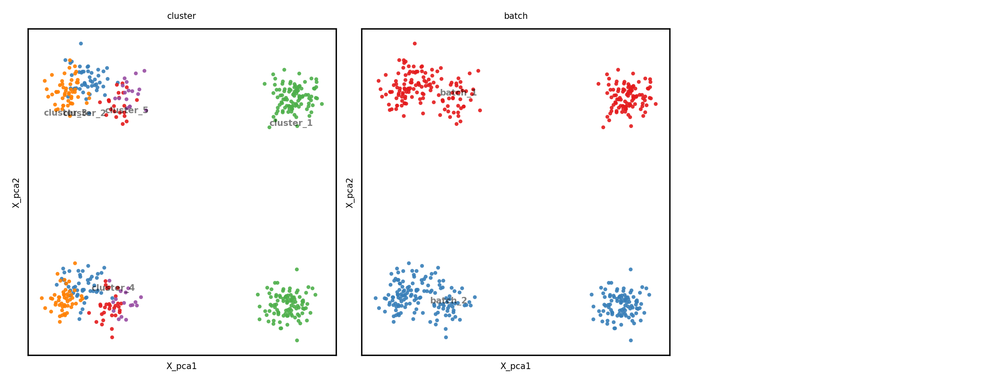

In [ ]:
show_basis = 'X_pca'
show_cols = [state_key, batch_key]

ccd.pl.plot_embedding(
    adata, show_basis, show_cols, figsize=(8,3), dpi=300, ncols=3, font_size=5, point_size=20, legend_loc='on data',
    save_path=save_dir / f"wtbatch_{show_basis}_{file_suffix}.png"
)

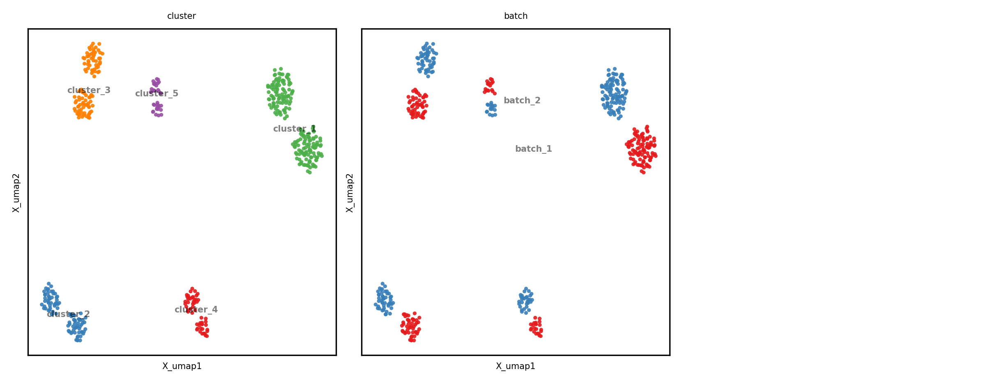

In [81]:
show_basis = 'X_umap'
ccd.pl.plot_embedding(
    adata, show_basis, show_cols, figsize=(8,3), dpi=300, ncols=3, font_size=5, point_size=20, legend_loc='on data',
    save_path=save_dir / f"wtbatch_{show_basis}_{file_suffix}.png"
)

### Concord

In [152]:
cur_ccd = ccd.Concord(adata=adata, 
                      input_feature=None, 
                      batch_size=32,
                      n_epochs=10,
                      lr=1e-2,
                      train_frac=1.0,
                      schedule_ratio = 0.97,
                      latent_dim=8, # latent dimension
                      encoder_dims = [64], # encoder architecture
                      decoder_dims = [64], # decoder architecture
                      norm_type = 'layer_norm',
                      use_importance_mask=False,
                      #importance_penalty_weight=1.0,
                      use_decoder=False,
                      domain_embedding_dim=8,
                      domain_key=batch_key, # key indicating batch
                      augmentation_mask_prob = 0.5, # augmentation mask probability, recommend between 0.1 and 0.7
                      clr_temperature = 0.5, # temperature for NT-Xent loss
                      seed=seed, # random seed
                      p_intra_domain = 1.0, # probability of intra-domain sampling
                      p_intra_knn=0.3,
                      use_faiss=False,
                      sampler_knn = adata.n_obs//6,
                      verbose=False, # print training progress
                      inplace=True, # whether to modify original adata, set to False if you want to keep all expressions
                      device=device, # device to run on
                      save_dir=save_dir # directory to save model checkpoints
                      ) 

# Encode data, saving the latent embedding in adata.obsm['Concord']
output_key = 'Concord'
cur_ccd.encode_adata(input_layer_key='X', output_key=output_key, preprocess=False)
# Save the latent embedding to a file, so that it can be loaded later
ccd.ul.save_obsm_to_hdf5(cur_ccd.adata, save_dir / f"obsm_{file_suffix}.h5")

Concord - WARNING - No input feature list provided. It is recommended to first select features using the command `concord.ul.select_features()`.
p_intra_knn: 0.3


Epoch 0 Training: 11it [00:00, 16.38it/s, loss=3.55]
Epoch 9 Training: 100%|██████████| 11/11 [00:00<00:00, 118.92it/s, loss=3.35]


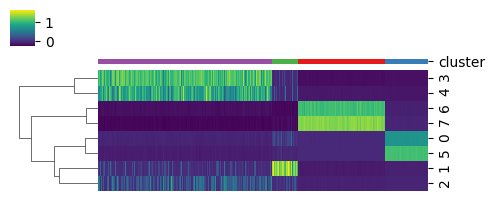

In [153]:
state_key = 'cluster'
ccd.pl.heatmap_with_annotations(adata, val='Concord', obs_keys=[state_key], 
                                cluster_cols=False, cluster_rows=True, cmap='viridis', 
                                pal = {'cluster': 'Set1'}, add_color_legend=False,
                                save_path=save_dir/f'Concord_latent_heatmap_{file_suffix}.pdf',
                                figsize=(5, 2), dpi=300)

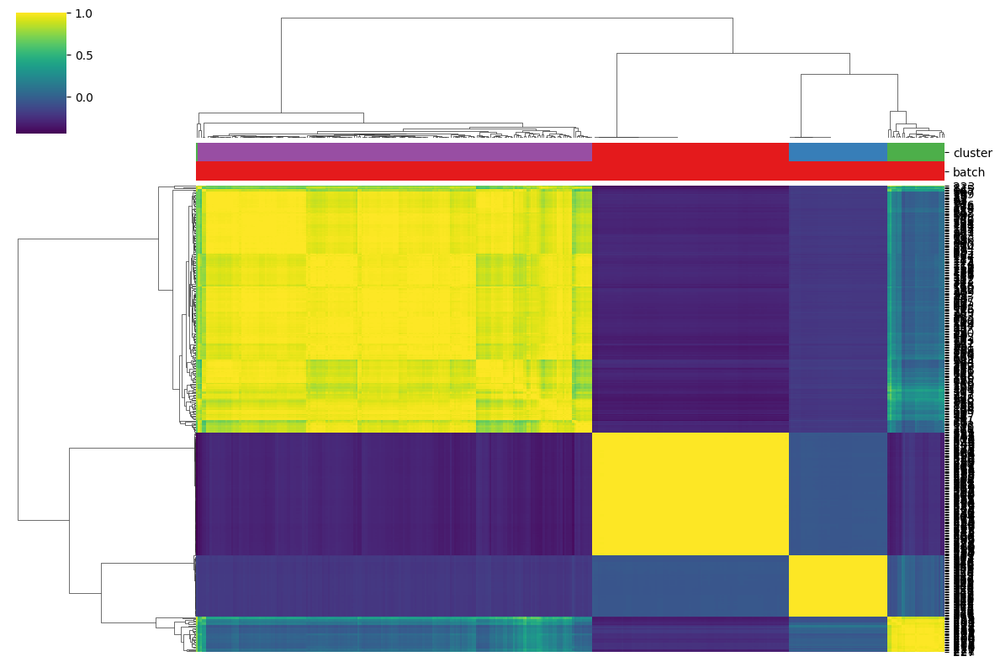

In [154]:
# Compute the correlation matrix
cos_mtx = ccd.ul.cosine_sim(adata.obsm['Concord'])
ccd.pl.heatmap_with_annotations(adata, val=cos_mtx,
                                obs_keys=[state_key, batch_key], cluster_cols=True, cluster_rows=True, cmap='viridis', save_path=save_dir/f'Concord_cosine_{file_suffix}.png')

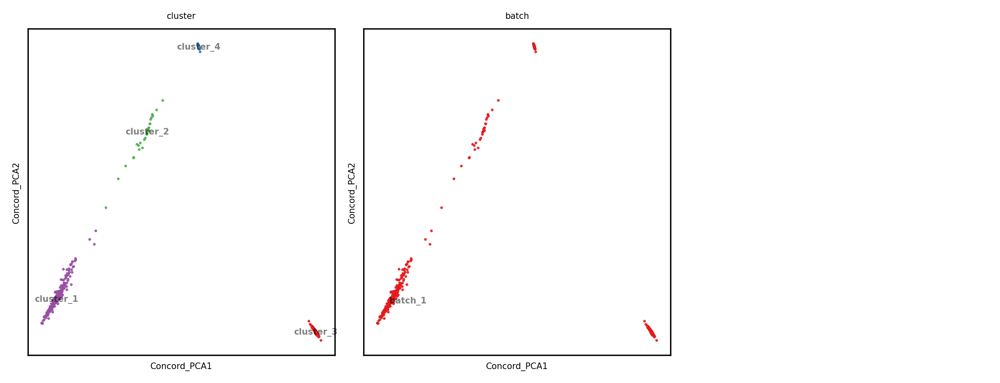

In [155]:
n_pc = min(adata.obsm[output_key].shape[1], adata.shape[0]) - 1
ccd.ul.run_pca(adata, source_key=output_key, result_key=f'{output_key}_PCA', n_pc=n_pc, random_state=seed)
show_basis = f'{output_key}_PCA'
show_cols = [state_key, batch_key]
ccd.pl.plot_embedding(
    adata, show_basis, show_cols, figsize=(8,3), dpi=300, ncols=3, font_size=5, point_size=10, legend_loc='on data',
    save_path=save_dir / f"{show_basis}_{file_suffix}.png"
)

In [156]:
ground_keys = ['PCA_no_noise', 'PCA_wt_noise']
ccd.ul.run_pca(adata_state, source_key='no_noise', result_key='PCA_no_noise', n_pc=30, random_state=seed)
ccd.ul.run_pca(adata_state, source_key='wt_noise', result_key='PCA_wt_noise', n_pc=30, random_state=seed)

# Put the PCA result in the adata object, so only one object is needed
adata.obsm['PCA_no_noise'] = adata_state.obsm['PCA_no_noise']
adata.obsm['PCA_wt_noise'] = adata_state.obsm['PCA_wt_noise']
adata.obsm


AxisArrays with keys: X_pca, Concord, Concord_PCA, PCA_no_noise, PCA_wt_noise

{'cluster_1': 0.015876869, 'cluster_2': 0.012504533, 'cluster_3': 0.00041190302, 'cluster_4': 3.675207e-05}
{'cluster_1': 19.13201522352831, 'cluster_2': 16.714061167262507, 'cluster_3': 3.250711879149206, 'cluster_4': 0.6192013068197938}


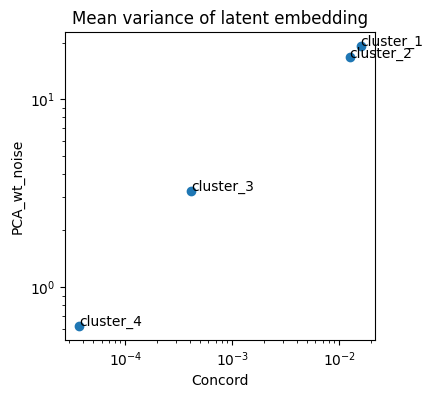

In [157]:
# Compute mean variance of the latent embedding for each cluster
def compute_mean_var(adata, obs_key, latent_key):
    mean_var = {}
    for state in adata.obs[obs_key].unique():
        idx = adata.obs[obs_key] == state
        mean_var[state] = np.mean(np.var(adata.obsm[latent_key][idx], axis=0))
    return mean_var

concord_mean_var = compute_mean_var(adata, state_key, 'Concord')
print(concord_mean_var)
original_mean_var = compute_mean_var(adata, state_key, 'PCA_wt_noise')
print(original_mean_var)

# plot the linear correspondence between the mean variance (log scale) of the latent embedding and the true state
# Label and color the points by the cluster label
import matplotlib.pyplot as plt
plt.figure(figsize=(4,4))
plt.scatter(list(concord_mean_var.values()), list(original_mean_var.values()))
for i, txt in enumerate(adata.obs[state_key].unique()):
    plt.annotate(txt, (list(concord_mean_var.values())[i], list(original_mean_var.values())[i]))
plt.xscale('log')
plt.yscale('log')
plt.xlabel('Concord')
plt.ylabel('PCA_wt_noise')
plt.title('Mean variance of latent embedding')
plt.savefig(save_dir/f"mean_variance_{file_suffix}.pdf", dpi=300)
plt.show()


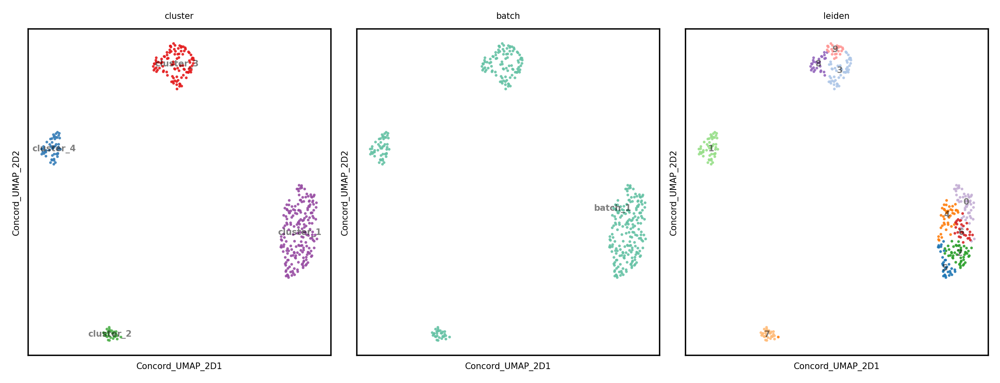

In [158]:
sc.pp.neighbors(adata, n_neighbors=30, use_rep = 'Concord')
ccd.ul.run_umap(adata, source_key='Concord', result_key='Concord_UMAP_2D', n_components=2, n_neighbors=30, min_dist=0.5, metric='euclidean', random_state=seed)
sc.tl.leiden(adata, resolution=1.0)
show_cols = [state_key, batch_key, 'leiden']
show_basis = 'Concord_UMAP_2D'   
ccd.pl.plot_embedding(
    adata, show_basis, show_cols, figsize=(8,3), dpi=300, ncols=3, font_size=5, point_size=10, legend_loc='on data',
    pal = {'cluster':'Set1', 'batch':'Set2', 'leiden':'tab20'},
    save_path=save_dir / f"{show_basis}_{file_suffix}.pdf"
)


In [159]:
adata.write_h5ad(data_dir / f"adata_{file_suffix}.h5ad") 
adata_state.write_h5ad(data_dir / f"adata_state_{file_suffix}.h5ad")

In [ ]:
file_suffix

'Nov13-1859'

# Run other methods

In [143]:
file_suffix = f"{time.strftime('%b%d-%H%M')}"
ccd.set_verbose_mode(True)
show_cols = [state_key, batch_key]
timer = ccd.ul.Timer()
time_log = {}

### Scanorama

In [144]:
output_key = 'Scanorama'

with timer:
    ccd.ul.run_scanorama(adata, batch_key="batch", output_key=output_key, return_corrected=True)

time_log[output_key] = timer.interval
ccd.ul.save_obsm_to_hdf5(adata, save_dir / f"obsm_{file_suffix}.h5")

Found 290 genes among all datasets
Found 290 genes among all datasets


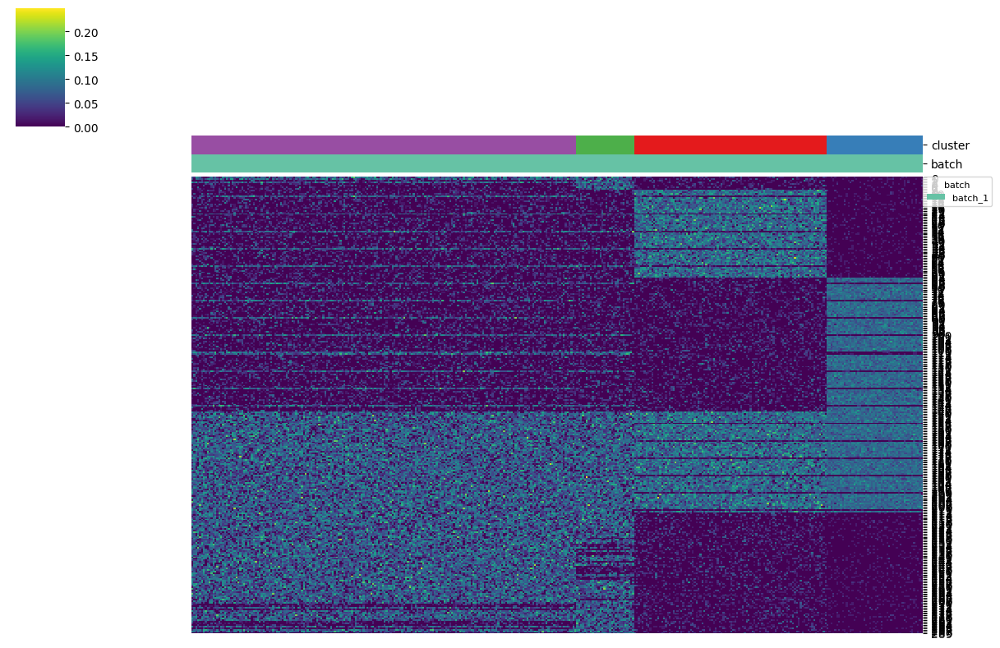

In [145]:
# Plot heatmap of Scanorama corrected data
ccd.pl.heatmap_with_annotations(adata, val=f'{output_key}_corrected', obs_keys=[state_key, batch_key], 
                                cluster_cols=False, cluster_rows=False, cmap='viridis', 
                                pal = {'cluster': 'Set1', 'batch':'Set2'}, add_color_legend=True,
                                save_path=save_dir/f'{output_key}_corrected_heatmap_{file_suffix}.png')

Concord - INFO - UMAP embedding stored in adata.obsm['Scanorama_UMAP']


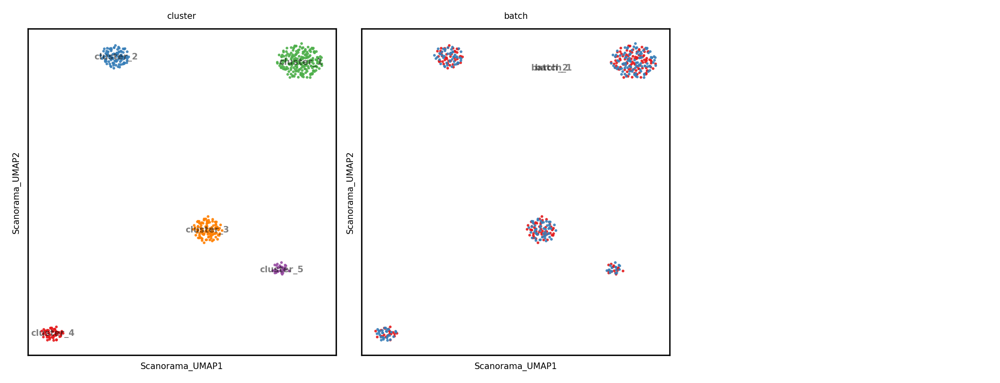

In [ ]:
ccd.ul.run_umap(adata, source_key=output_key, result_key=f'{output_key}_UMAP', n_components=2, n_neighbors=30, min_dist=0.5, metric='euclidean', random_state=seed)
show_basis = f'{output_key}_UMAP'
ccd.pl.plot_embedding(
    adata, show_basis, show_cols, figsize=(8,3), dpi=300, ncols=3, font_size=5, point_size=10, legend_loc='on data',
    save_path=save_dir / f"{show_basis}_{file_suffix}.png"
)

### Liger

In [11]:
output_key = 'Liger'
adata.layers["counts"] = adata.X.copy()
with timer:
    ccd.ul.run_liger(adata, batch_key="batch", count_layer="counts", output_key=output_key, k=30, return_corrected=True)

time_log[output_key] = timer.interval
ccd.ul.save_obsm_to_hdf5(adata, save_dir / f"obsm_{file_suffix}.h5")

100%|██████████| 30/30 [00:05<00:00,  5.75it/s]


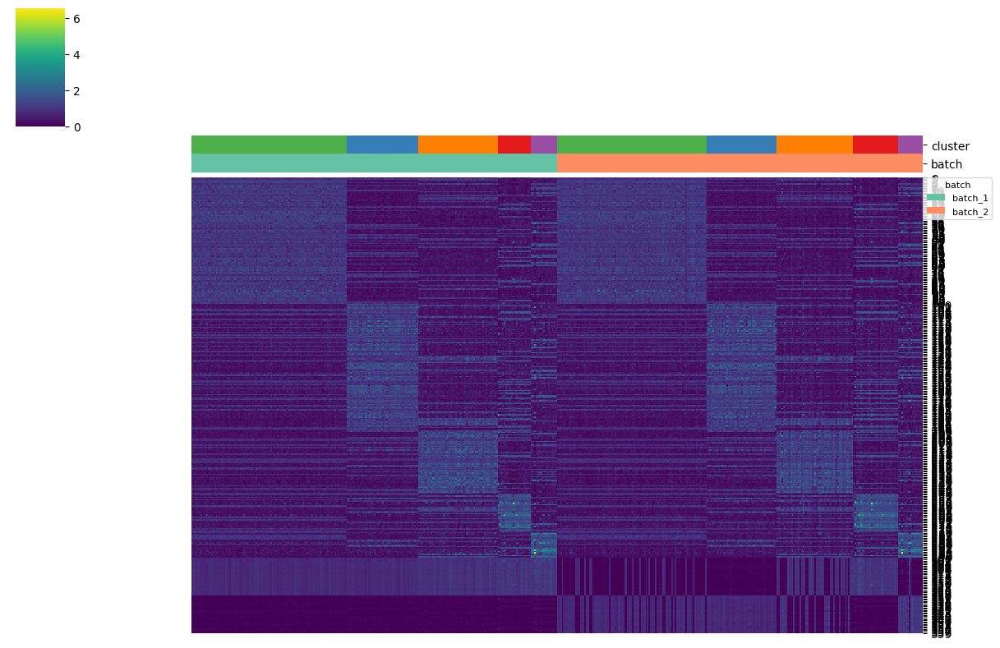

In [ ]:
# Plot heatmap of Scanorama corrected data
ccd.pl.heatmap_with_annotations(adata, val=f'{output_key}_corrected', obs_keys=[state_key, batch_key], 
                                cluster_cols=False, cluster_rows=False, cmap='viridis', 
                                pal = {'cluster': 'Set1', 'batch':'Set2'}, add_color_legend=True,
                                save_path=save_dir/f'{output_key}_corrected_heatmap_{file_suffix}.png')

Concord - INFO - UMAP embedding stored in adata.obsm['Liger_UMAP']


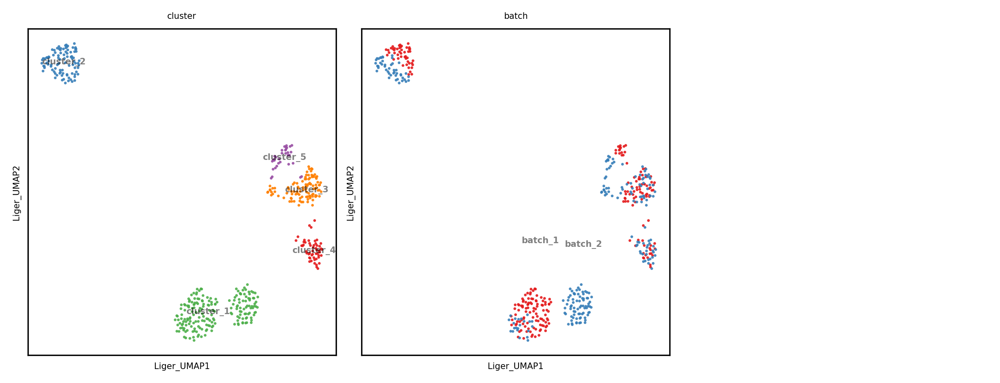

In [ ]:
ccd.ul.run_umap(adata, source_key=output_key, result_key=f'{output_key}_UMAP', n_components=2, n_neighbors=30, min_dist=0.5, metric='euclidean', random_state=seed)
show_basis = f'{output_key}_UMAP'
ccd.pl.plot_embedding(
    adata, show_basis, show_cols, figsize=(8,3), dpi=300, ncols=3, font_size=5, point_size=10, legend_loc='on data',
    save_path=save_dir / f"{show_basis}_{file_suffix}.png"
)

### Harmony

In [97]:
output_key = 'Harmony'
with timer:
    ccd.ul.run_harmony(adata, batch_key="batch", input_key='X_pca', output_key=output_key)

time_log[output_key] = timer.interval
ccd.ul.save_obsm_to_hdf5(adata, save_dir / f"obsm_{file_suffix}.h5")

	Initialization is completed.
	Completed 1 / 10 iteration(s).
	Completed 2 / 10 iteration(s).
	Completed 3 / 10 iteration(s).
Reach convergence after 3 iteration(s).


Concord - INFO - UMAP embedding stored in adata.obsm['Harmony_UMAP']


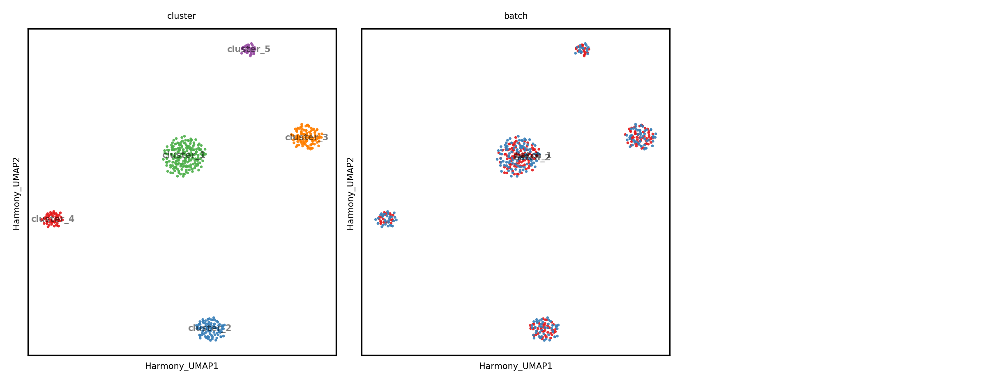

In [ ]:
ccd.ul.run_umap(adata, source_key=output_key, result_key=f'{output_key}_UMAP', n_components=2, n_neighbors=30, min_dist=0.5, metric='euclidean', random_state=seed)
show_basis = f'{output_key}_UMAP'
ccd.pl.plot_embedding(
    adata, show_basis, show_cols, figsize=(8,3), dpi=300, ncols=3, font_size=5, point_size=10, legend_loc='on data',
    save_path=save_dir / f"{show_basis}_{file_suffix}.png"
)

### scVI

In [13]:
output_key = 'scVI'
transform_batch = 'batch_1'
with timer:
    scvi_vae = ccd.ul.run_scvi(adata, batch_key="batch", output_key=output_key, return_model=True, return_corrected=True, transform_batch=transform_batch)

time_log[output_key] = timer.interval
ccd.ul.save_obsm_to_hdf5(adata, save_dir / f"obsm_{file_suffix}.h5")

An NVIDIA GPU may be present on this machine, but a CUDA-enabled jaxlib is not installed. Falling back to cpu.
Trainer will use only 1 of 4 GPUs because it is running inside an interactive / notebook environment. You may try to set `Trainer(devices=4)` but please note that multi-GPU inside interactive / notebook environments is considered experimental and unstable. Your mileage may vary.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3]


Epoch 400/400: 100%|██████████| 400/400 [00:26<00:00, 19.91it/s, v_num=1, train_loss_step=614, train_loss_epoch=611]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [00:26<00:00, 15.36it/s, v_num=1, train_loss_step=614, train_loss_epoch=611]


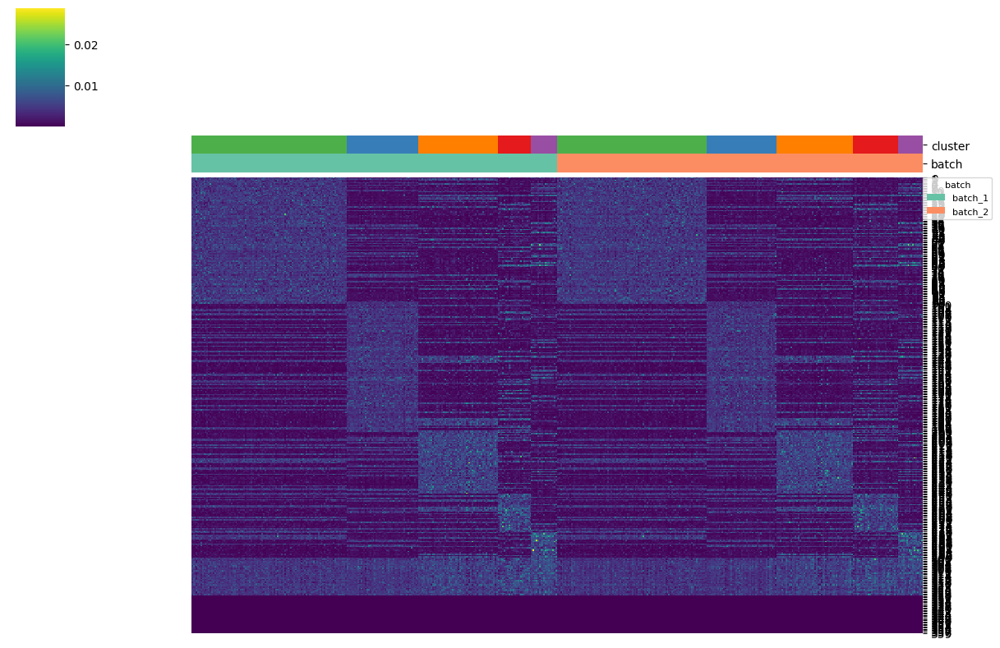

In [ ]:
# Plot heatmap of Scanorama corrected data
ccd.pl.heatmap_with_annotations(adata, val=f'{output_key}_corrected_{transform_batch}', obs_keys=[state_key, batch_key], 
                                cluster_cols=False, cluster_rows=False, cmap='viridis', 
                                pal = {'cluster': 'Set1', 'batch':'Set2'}, add_color_legend=True,
                                save_path=save_dir/f'{output_key}_{transform_batch}_corrected_heatmap_{file_suffix}.png')

Concord - INFO - UMAP embedding stored in adata.obsm['scVI_UMAP']


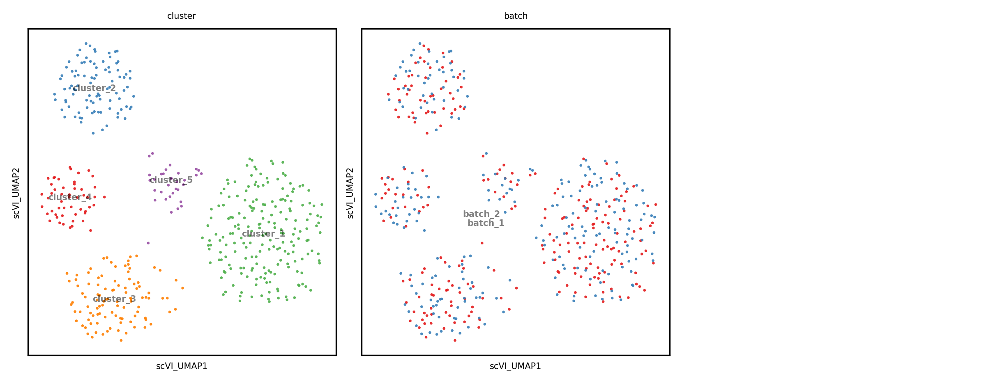

In [ ]:
output_key = 'scVI'
ccd.ul.run_umap(adata, source_key=output_key, result_key=f'{output_key}_UMAP', n_components=2, n_neighbors=30, min_dist=0.5, metric='euclidean', random_state=seed)
show_basis = f'{output_key}_UMAP'
ccd.pl.plot_embedding(
    adata, show_basis, show_cols, figsize=(8,3), dpi=300, ncols=3, font_size=5, point_size=10, legend_loc='on data',
    save_path=save_dir / f"{show_basis}_{file_suffix}.png"
)

### scANVI

In [ ]:
output_key = 'scANVI'
with timer:
    ccd.ul.run_scanvi(adata, batch_key="batch", labels_key=state_key, output_key=output_key, scvi_model=scvi_vae, return_corrected=True, transform_batch=transform_batch)

time_log[output_key] = timer.interval
ccd.ul.save_obsm_to_hdf5(adata, save_dir / f"obsm_{file_suffix}.h5")

INFO     Training for 20 epochs.                                                                                   


Trainer will use only 1 of 4 GPUs because it is running inside an interactive / notebook environment. You may try to set `Trainer(devices=4)` but please note that multi-GPU inside interactive / notebook environments is considered experimental and unstable. Your mileage may vary.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3]


Epoch 20/20: 100%|██████████| 20/20 [00:04<00:00,  8.45it/s, v_num=1, train_loss_step=613, train_loss_epoch=608]

`Trainer.fit` stopped: `max_epochs=20` reached.


Epoch 20/20: 100%|██████████| 20/20 [00:04<00:00,  4.20it/s, v_num=1, train_loss_step=613, train_loss_epoch=608]


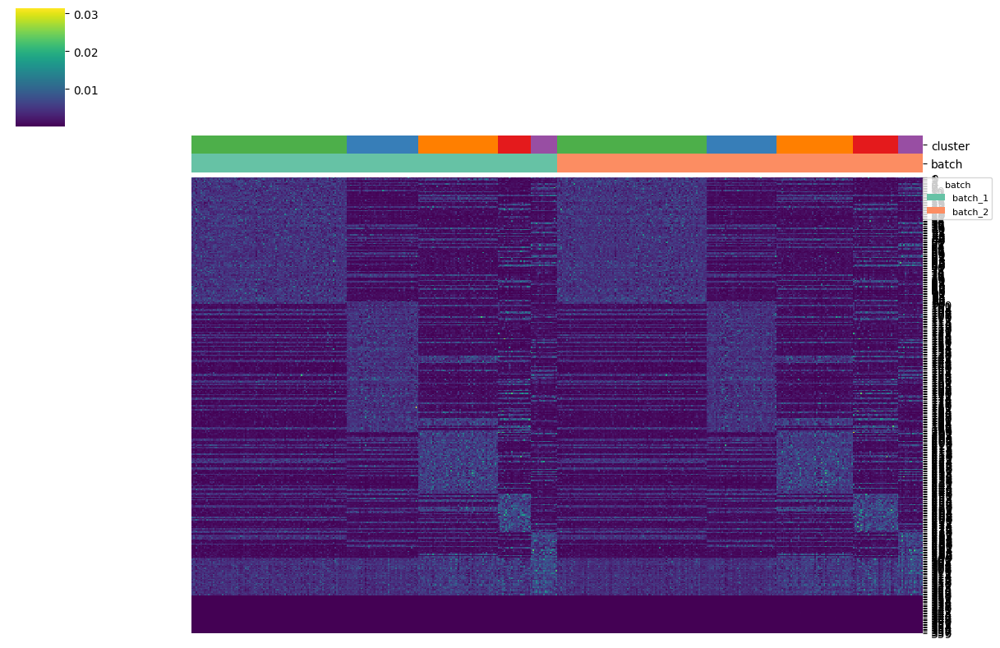

In [ ]:
# Plot heatmap of Scanorama corrected data
ccd.pl.heatmap_with_annotations(adata, val=f'{output_key}_corrected_{transform_batch}', obs_keys=[state_key, batch_key], 
                                cluster_cols=False, cluster_rows=False, cmap='viridis', 
                                pal = {'cluster': 'Set1', 'batch':'Set2'}, add_color_legend=True,
                                save_path=save_dir/f'{output_key}_{transform_batch}_corrected_heatmap_{file_suffix}.png')

Concord - INFO - UMAP embedding stored in adata.obsm['scANVI_UMAP']


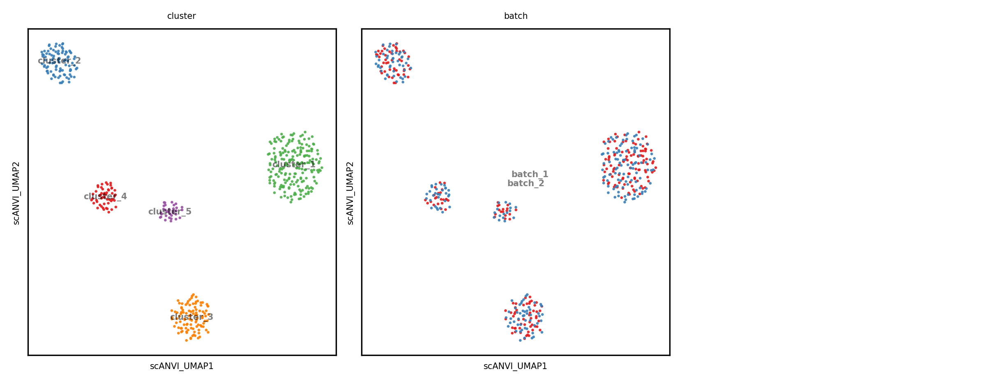

In [ ]:
ccd.ul.run_umap(adata, source_key=output_key, result_key=f'{output_key}_UMAP', n_components=2, n_neighbors=30, min_dist=0.5, metric='euclidean', random_state=seed)
show_basis = f'{output_key}_UMAP'
ccd.pl.plot_embedding(
    adata, show_basis, show_cols, figsize=(8,3), dpi=300, ncols=3, font_size=5, point_size=10, legend_loc='on data',
    save_path=save_dir / f"{show_basis}_{file_suffix}.png"
)

### Concord

In [106]:
cur_ccd = ccd.Concord(adata=adata, 
                      input_feature=None, 
                      batch_size=64,
                      n_epochs=10,
                      domain_key=batch_key, # key indicating batch
                      seed=seed, # random seed
                      verbose=False, # print training progress
                      device=device, # device to run on
                      save_dir=save_dir # directory to save model checkpoints
                      ) 

# Encode data, saving the latent embedding in adata.obsm['Concord']
output_key = 'Concord'
with timer:
    cur_ccd.encode_adata(input_layer_key='X', output_key=output_key, preprocess=False)
    
time_log[output_key] = timer.interval

# Save the latent embedding to a file, so that it can be loaded later
ccd.ul.save_obsm_to_hdf5(cur_ccd.adata, save_dir / f"obsm_{file_suffix}.h5")

Concord - WARNING - No input feature list provided. It is recommended to first select features using the command `concord.ul.select_features()`.


WARNING clustering 480 points to 21 centroids: please provide at least 819 training points


p_intra_knn: 0.3


Epoch 0 Training: 6it [00:00, 58.61it/s, loss=4.01]
Epoch 9 Training: 100%|██████████| 6/6 [00:00<00:00, 109.01it/s, loss=3.72]


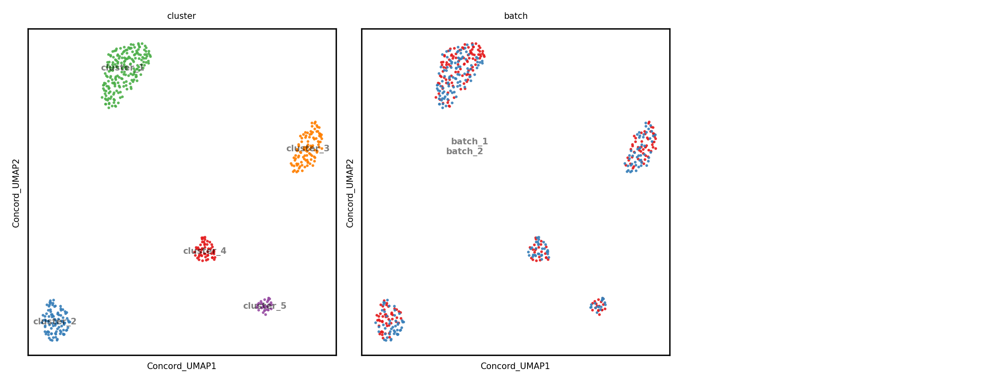

In [ ]:
ccd.ul.run_umap(adata, source_key=output_key, result_key=f'{output_key}_UMAP', n_components=2, n_neighbors=30, min_dist=0.5, metric='euclidean', random_state=seed)
show_basis = f'{output_key}_UMAP'
ccd.pl.plot_embedding(
    adata, show_basis, show_cols, figsize=(8,3), dpi=300, ncols=3, font_size=5, point_size=10, legend_loc='on data',
    save_path=save_dir / f"{show_basis}_{file_suffix}.png"
)

### Concord with decoder

In [ ]:
decoder_ccd = ccd.Concord(adata=adata, 
                      input_feature=None, 
                      batch_size=64,
                      n_epochs=10,
                      domain_key=batch_key, # key indicating batch
                      class_key=state_key, # key indicating class
                      use_classifier=False, # use classifier
                      use_decoder=True,
                      domain_embedding_dim=8,
                      seed=seed, # random seed
                      verbose=False, # print training progress
                      device=device, # device to run on
                      save_dir=save_dir # directory to save model checkpoints
                      ) 

output_key = 'Concord-decoder'
with timer:
    decoder_ccd.encode_adata(input_layer_key='X', output_key=output_key, preprocess=False)
    
time_log[output_key] = timer.interval
# Save the latent embedding to a file, so that it can be loaded later
ccd.ul.save_obsm_to_hdf5(decoder_ccd.adata, save_dir / f"obsm_{file_suffix}.h5")


Concord - WARNING - No input feature list provided. It is recommended to first select features using the command `concord.ul.select_features()`.


WARNING clustering 480 points to 21 centroids: please provide at least 819 training points


p_intra_knn: 0.3


Epoch 0 Training: 6it [00:00, 56.74it/s, loss=14.1]
Epoch 9 Training: 100%|██████████| 6/6 [00:00<00:00, 95.56it/s, loss=8.85]


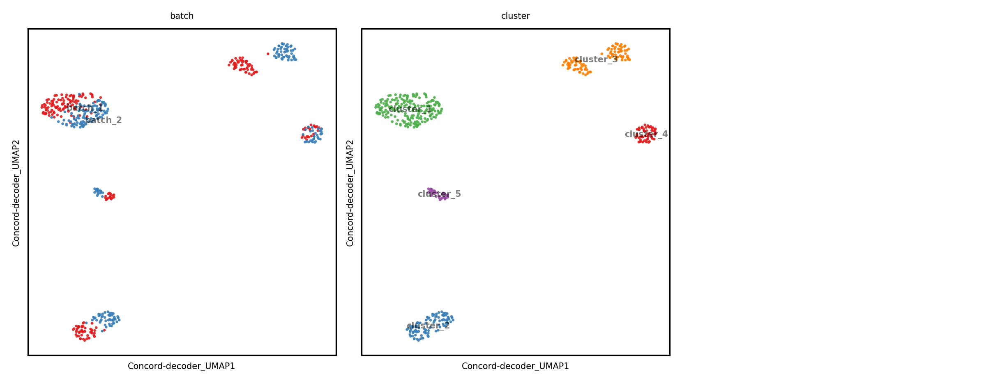

In [204]:
ccd.ul.run_umap(adata, source_key=output_key, result_key=f'{output_key}_UMAP', n_components=2, n_neighbors=30, min_dist=0.5, metric='euclidean', random_state=seed)
show_basis = f'{output_key}_UMAP'
ccd.pl.plot_embedding(
    adata, show_basis, show_cols, figsize=(8,3), dpi=300, ncols=3, font_size=5, point_size=10, legend_loc='on data',
    save_path=save_dir / f"{show_basis}_{file_suffix}.png"
)

In [205]:
# Predict and store the results
decoder_domains = adata.obs[batch_key].unique()
for domain in decoder_domains:
    _, decoded, _, _, _, _ = decoder_ccd.predict(decoder_ccd.loader, return_decoded=True, decoder_domain=domain, return_class=True, return_class_prob=True)
    save_key = f"{output_key}_decoded_{domain}"
    adata.layers[save_key] = decoded

adata.layers

Layers with keys: counts, Concord-decoder_decoded_batch_1, Concord-decoder_decoded_batch_2

### Concord with classifier

In [ ]:
cur_ccd = ccd.Concord(adata=adata, 
                      input_feature=None, 
                      batch_size=64,
                      n_epochs=10,
                      domain_key=batch_key, # key indicating batch
                      class_key=state_key, # key indicating class
                      use_classifier=True, # use classifier
                      seed=seed, # random seed
                      verbose=False, # print training progress
                      device=device, # device to run on
                      save_dir=save_dir # directory to save model checkpoints
                      ) 

# Encode data, saving the latent embedding in adata.obsm['Concord']
output_key = 'Concord-class'
with timer:
    cur_ccd.encode_adata(input_layer_key='X', output_key=output_key, preprocess=False)
    
time_log[output_key] = timer.interval
# Save the latent embedding to a file, so that it can be loaded later
ccd.ul.save_obsm_to_hdf5(cur_ccd.adata, save_dir / f"obsm_{file_suffix}.h5")

Concord - WARNING - No input feature list provided. It is recommended to first select features using the command `concord.ul.select_features()`.


WARNING clustering 480 points to 21 centroids: please provide at least 819 training points


p_intra_knn: 0.3


Epoch 0 Training: 6it [00:00, 80.59it/s, loss=4.68]
Epoch 9 Training: 100%|██████████| 6/6 [00:00<00:00, 85.68it/s, loss=3.58]


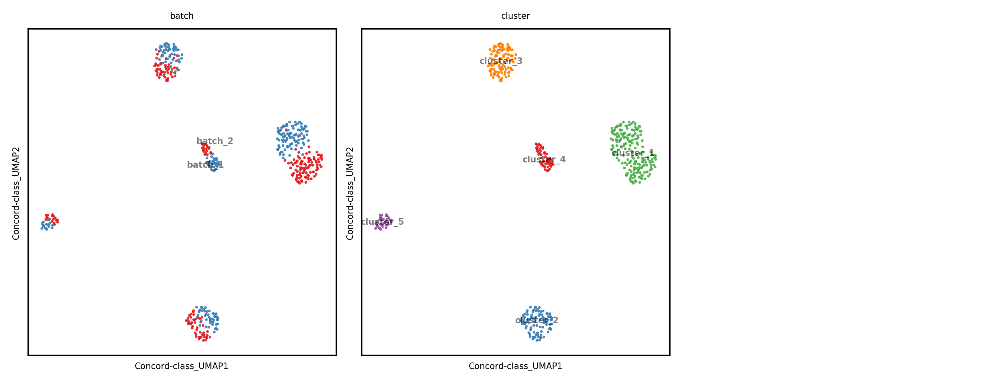

In [212]:
ccd.ul.run_umap(adata, source_key=output_key, result_key=f'{output_key}_UMAP', n_components=2, n_neighbors=30, min_dist=0.5, metric='euclidean', random_state=seed)
show_basis = f'{output_key}_UMAP'
ccd.pl.plot_embedding(
    adata, show_basis, show_cols, figsize=(8,3), dpi=300, ncols=3, font_size=5, point_size=10, legend_loc='on data',
    save_path=save_dir / f"{show_basis}_{file_suffix}.png"
)

In [213]:
adata.obsm['Unintegrated'] = adata.obsm['X_pca']

In [17]:
adata.write_h5ad(data_dir / f"adata_{file_suffix}.h5ad")
file_suffix

'Nov10-1232'

# Evaluation

In [8]:
adata.obsm

AxisArrays with keys: Concord, Concord-class, Concord-class_UMAP, Concord-decoder, Concord-decoder_UMAP, Concord_PCA, Concord_UMAP, Concord_UMAP_2D, Harmony, Harmony_UMAP, Liger, Liger_UMAP, Scanorama, Scanorama_UMAP, Unintegrated, X_draw_graph_kk, X_pca, X_umap, scANVI, scANVI_UMAP, scVI, scVI_UMAP

In [10]:
adata = sc.read(data_dir / f"adata_Nov10-1232.h5ad")
adata_state = sc.read(data_dir / f"adata_state_Nov06-1351.h5ad")

In [11]:
latent_keys = ["Unintegrated", "Scanorama", "Liger", "Harmony", "scVI", "scANVI", "Concord", 'Concord-decoder', "Concord-class"]
ground_keys = ['PCA_no_noise', 'PCA_wt_noise']
combined_keys = latent_keys + ground_keys
ccd.ul.run_pca(adata_state, source_key='no_noise', result_key='PCA_no_noise', n_pc=30, random_state=seed)
ccd.ul.run_pca(adata_state, source_key='wt_noise', result_key='PCA_wt_noise', n_pc=30, random_state=seed)

# Put the PCA result in the adata object, so only one object is needed
adata.obsm['PCA_no_noise'] = adata_state.obsm['PCA_no_noise']
adata.obsm['PCA_wt_noise'] = adata_state.obsm['PCA_wt_noise']
adata.obsm

Concord - INFO - PCA performed on source data with 30 components
Concord - INFO - PCA embedding stored in adata.obsm['PCA_no_noise']
Concord - INFO - PCA performed on source data with 30 components
Concord - INFO - PCA embedding stored in adata.obsm['PCA_wt_noise']


AxisArrays with keys: Concord, Concord-class, Concord-class_UMAP, Concord-decoder, Concord-decoder_UMAP, Concord_PCA, Concord_UMAP, Concord_UMAP_2D, Harmony, Harmony_UMAP, Liger, Liger_UMAP, Scanorama, Scanorama_UMAP, Unintegrated, X_draw_graph_kk, X_pca, X_umap, scANVI, scANVI_UMAP, scVI, scVI_UMAP, PCA_no_noise, PCA_wt_noise

### Scib

In [25]:
from scib_metrics.benchmark import Benchmarker
bm = Benchmarker(
    adata,
    batch_key=batch_key,
    label_key=state_key,
    embedding_obsm_keys=latent_keys,
    n_jobs=6,
)
bm.benchmark()

Embeddings: 100%|██████████| 9/9 [00:23<00:00,  2.59s/it]


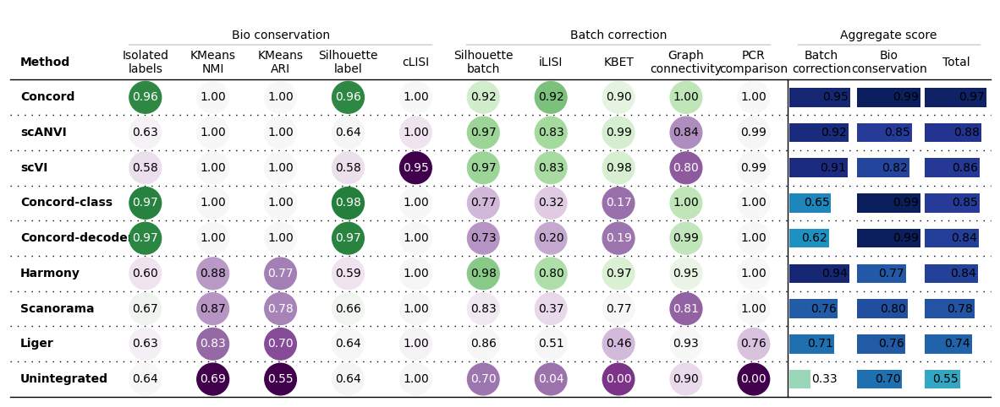

In [59]:
import matplotlib.pyplot as plt
import os
bm.plot_results_table(min_max_scale=False, show=False)
fig = plt.gcf()
fig.set_size_inches(15, 6) 
fig.savefig(os.path.join(save_dir, f'scibmetrics_results_{file_suffix}.pdf'), facecolor='white', dpi=600)
plt.show()
plt.close(fig)

### Topology

Run topological analysis pipeline:

In [72]:
dg_list = {}
homology_dimensions = [0,1,2]
topology_final_metrics, dg_list, betti_stats_pivot, distance_metrics_df = ccd.ul.benchmark_topology(adata, keys=combined_keys, homology_dimensions=[0,1,2], expected_betti_numbers=[4,0,0])

Concord - INFO - Computing persistent homology for Unintegrated
Concord - INFO - Computing persistent homology for Scanorama
Concord - INFO - Computing persistent homology for Liger
Concord - INFO - Computing persistent homology for Harmony
Concord - INFO - Computing persistent homology for scVI
Concord - INFO - Computing persistent homology for scANVI
Concord - INFO - Computing persistent homology for Concord
Concord - INFO - Computing persistent homology for Concord-decoder
Concord - INFO - Computing persistent homology for Concord-class
Concord - INFO - Computing persistent homology for PCA_no_noise
Concord - INFO - Computing persistent homology for PCA_wt_noise


In [75]:
topology_final_metrics

Betti curve               Betti number
                    Entropy      Variance  L1 distance
Method                                                
Concord            1.720809   2257.887500            0
Concord-class      1.067926   1678.680200            0
Concord-decoder    1.457155   1998.265367            0
Harmony            2.959902  10527.310167          358
Liger              3.248562  10095.275533            0
PCA_no_noise       1.527112      0.162333            0
PCA_wt_noise       3.142707   8798.338600          358
Scanorama          3.139736  12821.169200          475
Unintegrated       3.439678  16550.905700          475
scANVI             3.775072   9834.805133            3
scVI               3.577201  10408.265933            4

In [84]:
topology_scores = ccd.ul.benchmark_stats_to_score(topology_final_metrics.drop(index=['PCA_no_noise', 'PCA_wt_noise']), min_max_scale=True, one_minus=True, aggregate_score=True, aggregate_class='Topology')
topology_scores

Betti curve                               Betti number  \
                1-Entropy(min-max) 1-Variance(min-max) 1-L1 distance(min-max)   
Method                                                                          
Concord                   0.758829            0.961054               1.000000   
Concord-class             1.000000            1.000000               1.000000   
Concord-decoder           0.856221            0.978511               1.000000   
Harmony                   0.301118            0.405023               0.246316   
Liger                     0.194489            0.434073               1.000000   
Scanorama                 0.234688            0.250785               0.000000   
Unintegrated              0.123892            0.000000               0.000000   
scANVI                    0.000000            0.451587               0.993684   
scVI                      0.073092            0.413028               0.991579   

                Aggregate score  
                       Topology  
Method                           
Concord                0.906628  
Concord-class          1.000000  
Concord-decoder        0.944911  
Harmony                0.317486  
Liger                  0.542854  
Scanorama              0.161825  
Unintegrated           0.041297  
scANVI                 0.481757  
scVI                   0.492566

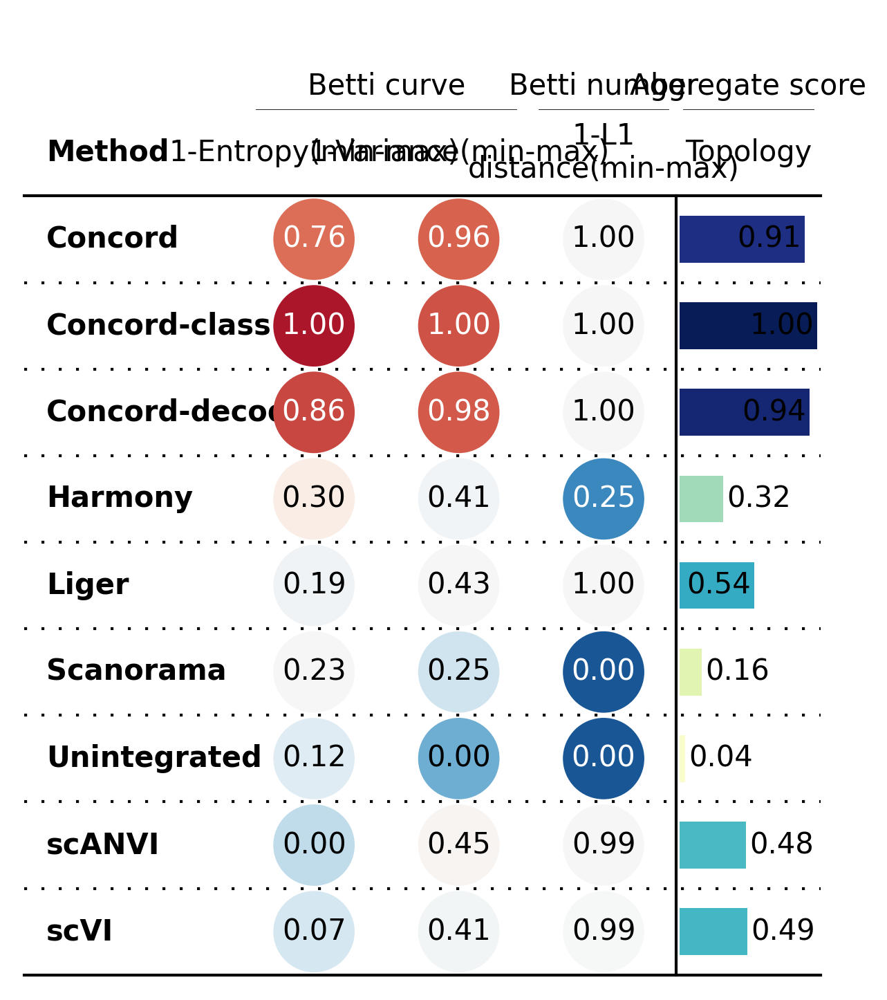

In [86]:

ccd.pl.plot_benchmark_table(topology_scores, pal='RdBu_r', save_path=save_dir / f"topology_results_{file_suffix}.png")

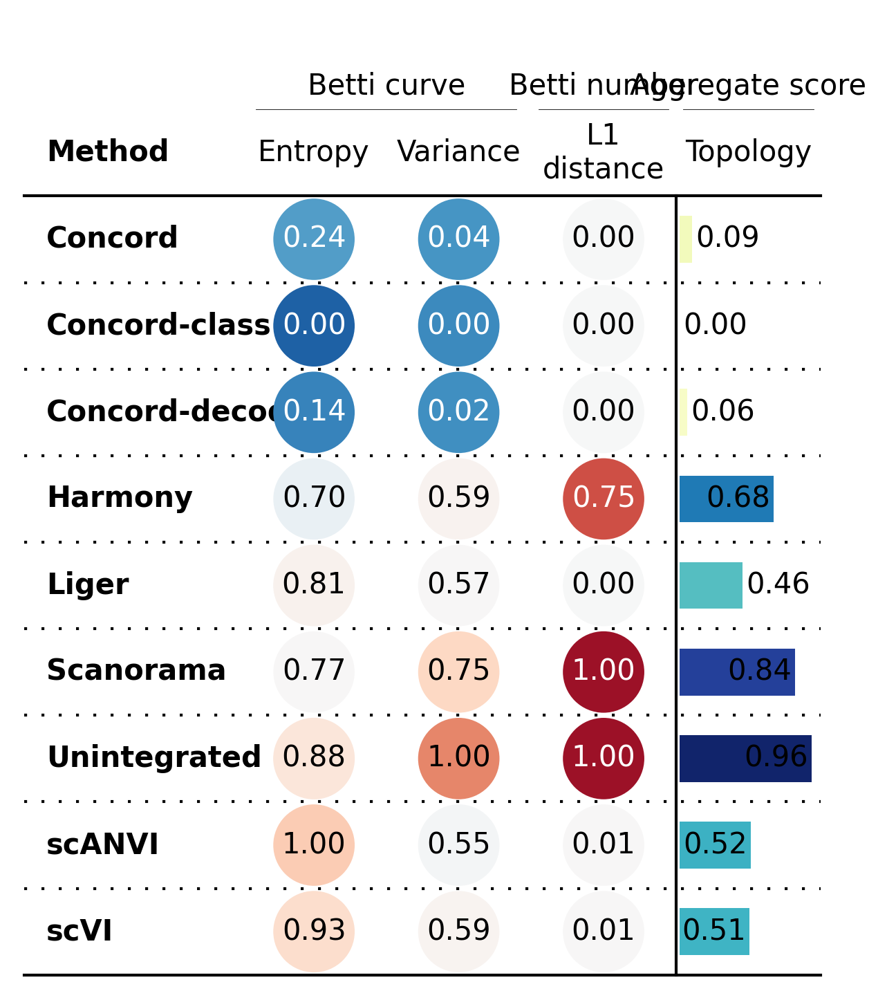

In [ ]:
plot_table = topology_final_metrics
ccd.pl.plot_benchmark_table(plot_table, min_max_scale=True, aggregate_score=True, aggregate_class='Topology', pal='RdBu_r', save_path=save_dir / f"topology_results_{file_suffix}.png")

In [106]:
topology_final_metrics.to_csv(save_dir / f"topology_final_metrics_{file_suffix}.csv")
topology_final_metrics

,Entropy,Variance,L1 distance
Method,,,
Concord,1.720809,2257.887500,0
Concord-class,1.067926,1678.680200,0
Concord-decoder,1.457155,1998.265367,0
Harmony,2.959902,10527.310167,358
Liger,3.248562,10095.275533,0
PCA_no_noise,1.527112,0.162333,0
PCA_wt_noise,3.142707,8798.338600,358
Scanorama,3.139736,12821.169200,475
Unintegrated,3.439678,16550.905700,475


In [104]:
betti_stats_pivot.to_csv(save_dir / f"betti_stats_pivot_{file_suffix}.csv")
betti_stats_pivot


Dimension           Dim 0                                       Dim 1         \
Statistic         Entropy    Mean Median   Mode    Variance   Entropy   Mean   
Method                                                                         
Concord          2.497874   21.37    4.0    4.0   6757.9931  1.449664   0.75   
Concord-class    2.481613   16.36    4.0    4.0   5024.6704  0.722164   0.43   
Concord-decoder  2.441448   18.59    4.0    4.0   5987.3419  1.247110   0.47   
Harmony          4.345296  307.55  362.0  362.0  31403.7675  2.454827   3.71   
Liger            3.413387  102.13    4.0    4.0  30171.3331  3.446425   6.34   
PCA_no_noise     4.581335    3.77    4.0    4.0      0.4771  0.000000   0.01   
PCA_wt_noise     3.939024  153.01   57.0  362.0  26298.9299  3.008855   3.96   
Scanorama        4.140916  239.02  326.5  479.0  38384.0196  2.898692   3.06   
Unintegrated     4.035940  238.86  219.5  479.0  48668.9004  3.575867  20.42   
scANVI           4.074663  181.50  133.0    0.0  28996.6900  3.919688   5.58   
scVI             4.182126  204.31  193.5    0.0  28660.5539  3.764128   6.42   

Dimension                                 Dim 2                             
Statistic       Median Mode  Variance   Entropy  Mean Median Mode Variance  
Method                                                                      
Concord            0.0  0.0   15.4075  1.214890  0.09    0.0  0.0   0.2619  
Concord-class      0.0  0.0   10.8851  0.000000  0.07    0.0  0.0   0.4851  
Concord-decoder    0.0  0.0    7.2091  0.682908  0.07    0.0  0.0   0.2451  
Harmony            0.0  0.0  152.6259  2.079583  1.27    0.0  0.0  25.5371  
Liger              0.0  0.0  113.3244  2.885875  0.47    0.0  0.0   1.1691  
PCA_no_noise       0.0  0.0    0.0099  0.000000  0.00    0.0  0.0   0.0000  
PCA_wt_noise       0.0  0.0   89.2784  2.480243  0.85    0.0  0.0   6.8075  
Scanorama          0.0  0.0   61.1564  2.379600  1.22    0.0  0.0  18.3316  
Unintegrated       3.0  0.0  982.8836  2.707226  0.37    0.0  0.0   0.9331  
scANVI             3.5  0.0   38.2836  3.373712  0.88    0.0  0.0   2.3256  
scVI               1.0  0.0   62.9836  3.537005  1.37    0.0  0.0   4.5331

In [103]:
distance_metrics_df.to_csv(save_dir / f"betti_distance_metrics_df_{file_suffix}.csv")
distance_metrics_df

,L1 Distance,L2 Distance,Total Relative Error,Observed Betti Numbers,Expected Betti Numbers
Method,,,,,
Unintegrated,475,475.0,118.75,"479, 0, 0","4, 0, 0"
Scanorama,475,475.0,118.75,"479, 0, 0","4, 0, 0"
Liger,0,0.0,0.00,"4, 0, 0","4, 0, 0"
Harmony,358,358.0,89.50,"362, 0, 0","4, 0, 0"
scVI,4,4.0,1.00,"0, 0, 0","4, 0, 0"
scANVI,4,4.0,1.00,"0, 0, 0","4, 0, 0"
Concord,0,0.0,0.00,"4, 0, 0","4, 0, 0"
Concord-decoder,0,0.0,0.00,"4, 0, 0","4, 0, 0"
Concord-class,0,0.0,0.00,"4, 0, 0","4, 0, 0"


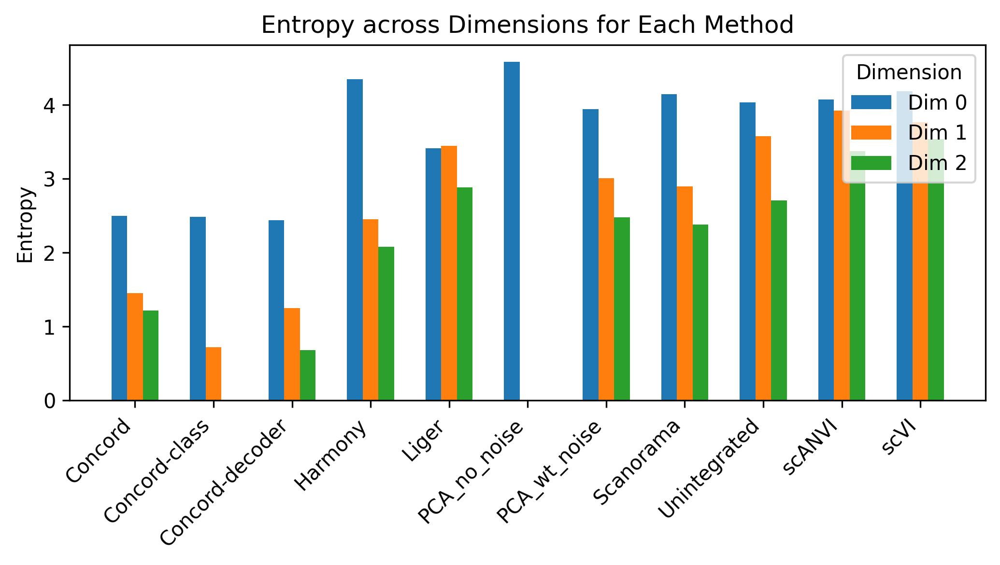

In [107]:
ccd.pl.plot_betti_statistic(betti_stats_pivot, statistic='Entropy', pal='tab10', save_path=save_dir / f"betti_entropy_{file_suffix}.png")


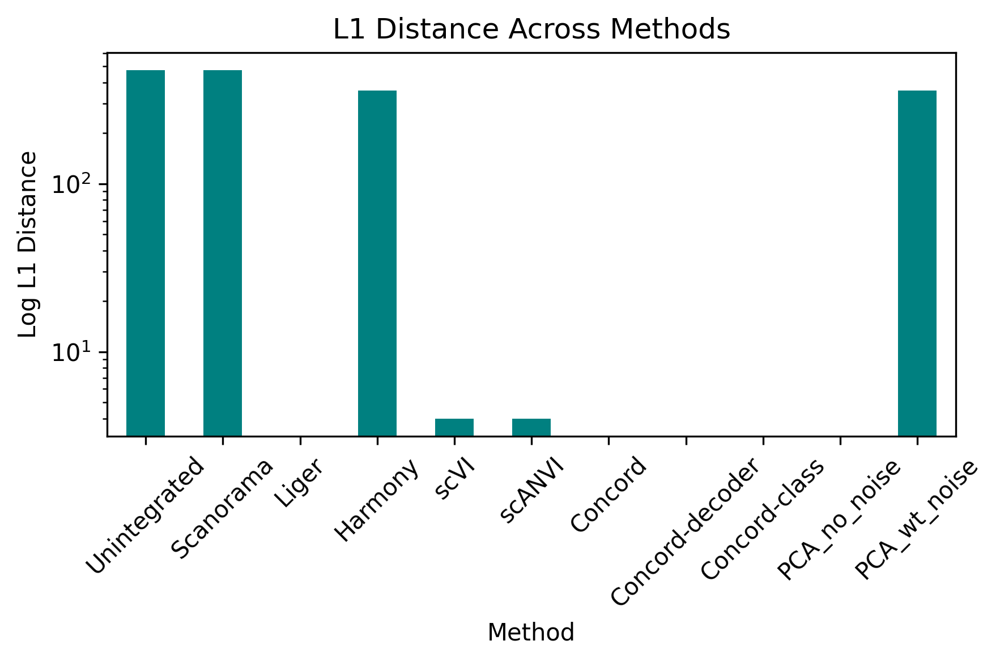

In [108]:
ccd.pl.plot_betti_distance(distance_metrics_df, metric='L1 Distance', log_y=True, save_path=save_dir / f"betti_distance_L1_{file_suffix}.png")

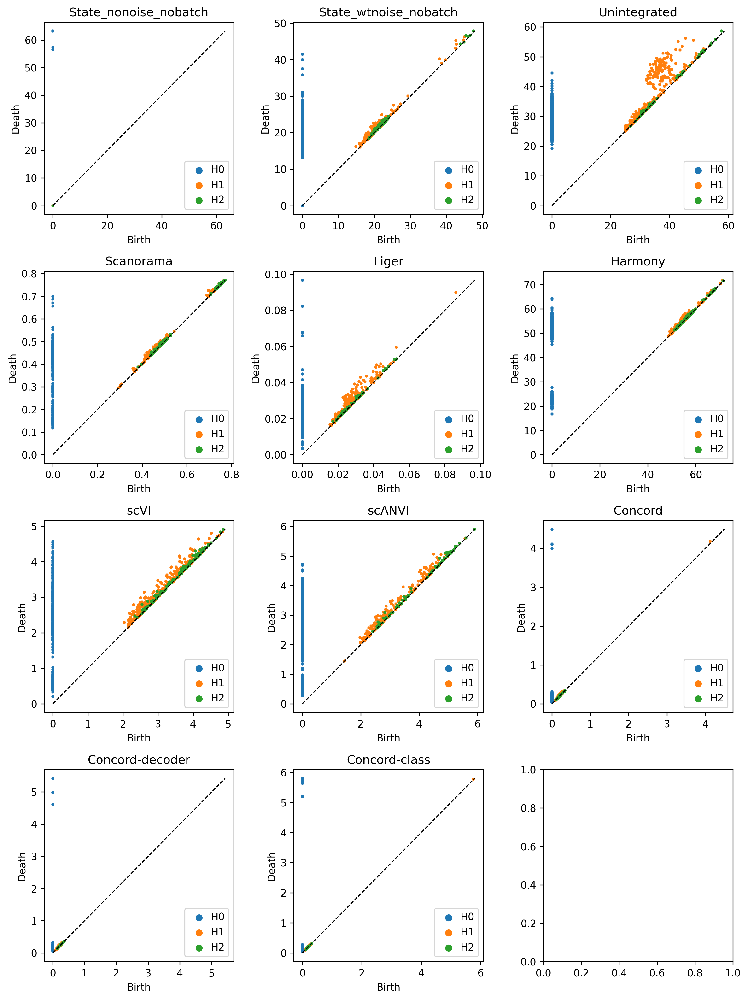

In [ ]:
# Plot the persistence diagrams into a single figure
import matplotlib.pyplot as plt
combined_keys = list(dg_list.keys())
n_plots = len(combined_keys)
n_cols = 3
n_rows = int(np.ceil(n_plots / n_cols))
base_height = 3.5
base_width = 3.5
fig, axes = plt.subplots(n_rows, n_cols, figsize=(base_width * n_cols, base_height * n_rows), dpi=300)
for i, key in enumerate(combined_keys):
    ax = axes[i // n_cols, i % n_cols]
    ccd.ul.plot_persistence_diagram(dg_list[key], ax=ax, marker_size=4, title=key, show=False)

# Save the plot
fig.tight_layout()
fig.savefig(save_dir / f"persistence_diagram_{file_suffix}.png", dpi=300)
plt.show()

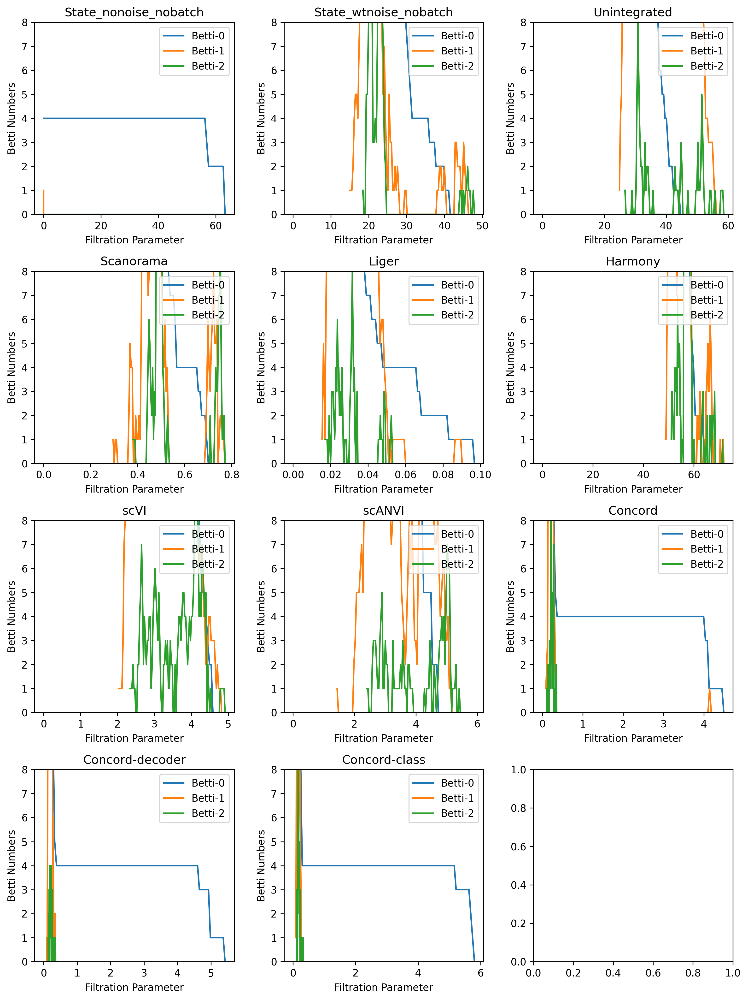

In [ ]:
# Plot the betti curves into a single figure
import matplotlib.pyplot as plt
combined_keys = list(dg_list.keys())
n_plots = len(combined_keys)
n_cols = 3
n_rows = int(np.ceil(n_plots / n_cols))
base_height = 3.5
base_width = 3.5
fig, axes = plt.subplots(n_rows, n_cols, figsize=(base_width * n_cols, base_height * n_rows), dpi=300)
for i, key in enumerate(combined_keys):
    ax = axes[i // n_cols, i % n_cols]
    ccd.ul.plot_betti_curves(dg_list[key], nbins=100, ymax=8, ax=ax, title=key, show=False)

# Save the plot
fig.tight_layout()
fig.savefig(save_dir / f"betti_curve_{file_suffix}.png", dpi=300)
plt.show()

knn graph:

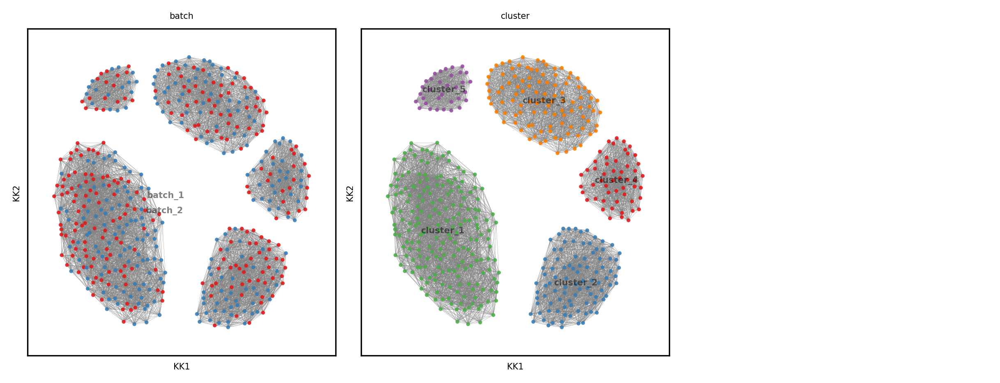

In [ ]:
show_basis = 'Concord'
show_cols = [batch_key, state_key]
layout='kk'
k=30

ccd.pl.plot_graph(
    adata, show_basis, k=k, layout=layout, edges=True,
    color_by=show_cols, figsize=(8,3), dpi=300, ncols=3, font_size=5, point_size=20, legend_loc='on data',
    save_path=save_dir / f"{k}nn_graph_{show_basis}_{file_suffix}.png"
)

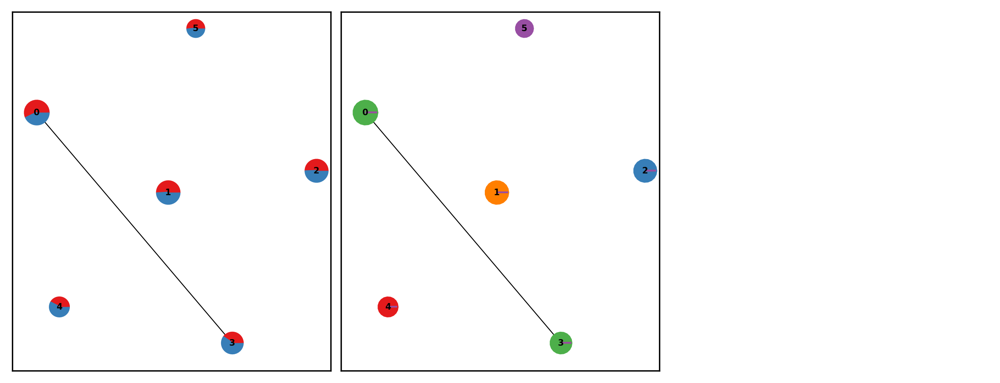

In [ ]:
show_basis = 'Concord'
show_cols = [batch_key, state_key]
layout='kk'
k=30
resolution = 1.0
cluster_key = 'leiden_concord'

sc.tl.leiden(adata, resolution=resolution, key_added=cluster_key)
ccd.pl.plot_paga(
    adata, show_basis, k=k, 
    threshold=0.1,
    groups = cluster_key,
    resolution=.4, 
    layout=layout, 
    color_by=show_cols, 
    node_size_scale=1, edge_width_scale=0.1,
    figsize=(8,3), dpi=300, ncols=3, font_size=5, 
    save_path=save_dir / f"{k}nn_paga_{show_basis}_{file_suffix}.png"
)

# Geomtric Features 

### Integrated benchmark pipeline

Concord - INFO - Computing cell distance correlation
Concord - INFO - Computing local vs distal correlation
Concord - INFO - Computing trustworthiness
Concord - INFO - Computing cluster centroid distances correlation
Concord - INFO - Computing state-batch distance ratio


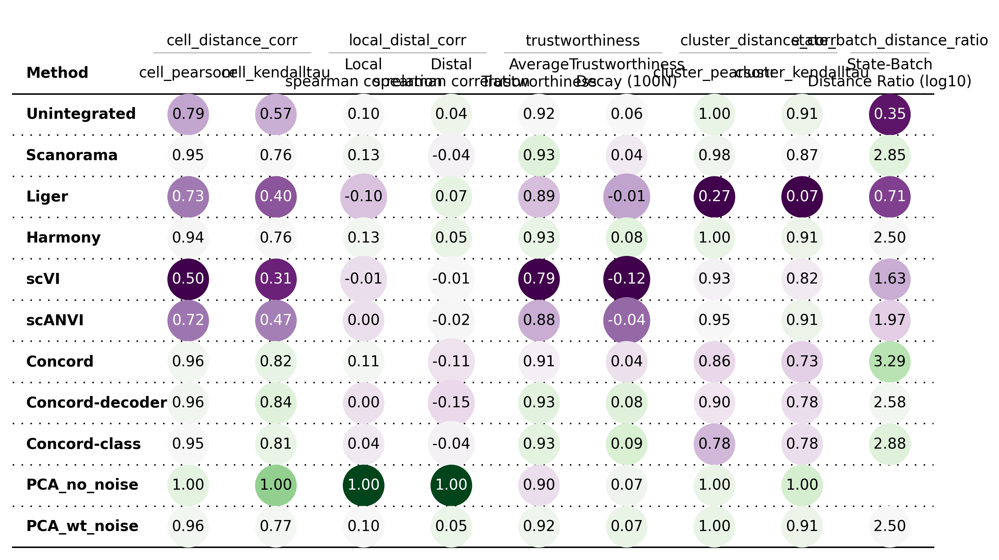

In [67]:
geometry_metrics = ['cell_distance_corr', 'local_distal_corr', 'trustworthiness', 'cluster_distance_corr', 'state_batch_distance_ratio']
geometry_results = ccd.ul.benchmark_geometry(adata, keys=combined_keys, eval_metrics=geometry_metrics, 
                                      dist_metric='cosine', 
                                      corr_types = ['pearsonr', 'kendalltau'], 
                                      groundtruth_key = 'PCA_no_noise', 
                                      state_key = state_key,
                                      batch_key = batch_key,
                                      return_type='dataframe',
                                      save_dir=save_dir, 
                                      file_suffix=file_suffix)
ccd.pl.plot_benchmark_table(geometry_results, min_max_scale=False, save_path=save_dir / f"geometry_results_{file_suffix}.png")

Index(['Geometry'], dtype='object')


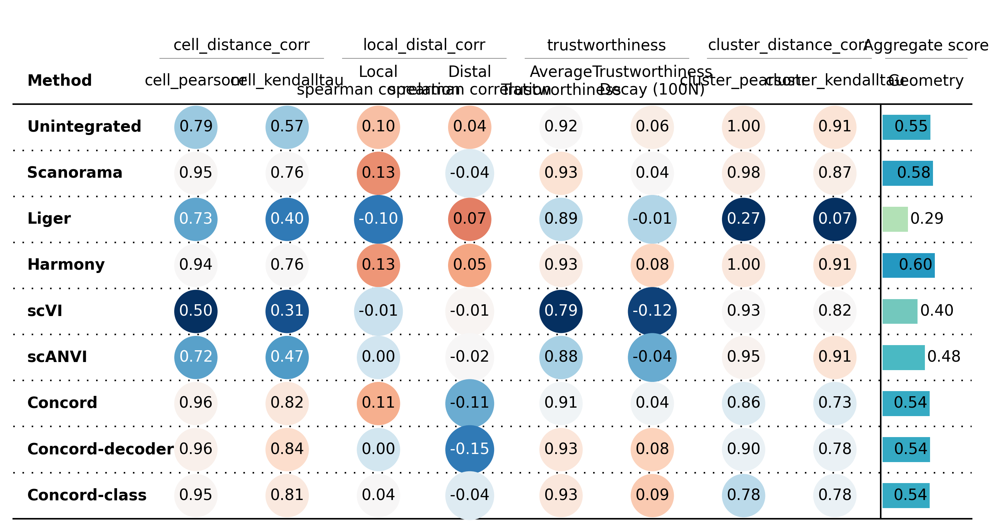

In [68]:
# Exclude state_batch_distance_ratio and plot
plot_table = geometry_results.drop(columns=['state_batch_distance_ratio'], index=['PCA_no_noise', 'PCA_wt_noise'])
ccd.pl.plot_benchmark_table(plot_table, min_max_scale=False, aggregate_score=True, pal='RdBu_r', save_path=save_dir / f"geometry_results_{file_suffix}.png")

In [42]:
# convert geometry_scores to a dataframe
geometry_scores_df = pd.DataFrame(geometry_scores)

In [44]:
geometry_scores_df.mean(axis=1)

Unintegrated       0.528833
Scanorama          0.726771
Liger              0.342820
Harmony            0.715295
scVI               0.505499
scANVI             0.595068
Concord            0.726455
Concord-decoder    0.677541
Concord-class      0.701115
PCA_no_noise       0.975248
PCA_wt_noise       0.715160
dtype: float64

In [40]:
import pandas as pd
for key in geometry_scores:
    print(geometry_scores[key])

Unintegrated       0.701875
Scanorama          0.874204
Liger              0.561520
Harmony            0.870585
scVI               0.412430
scANVI             0.608466
Concord            0.908420
Concord-decoder    0.922887
Concord-class      0.900202
PCA_no_noise       1.000000
PCA_wt_noise       0.885435
dtype: float64
Unintegrated       0.067743
Scanorama          0.043664
Liger             -0.014481
Harmony            0.090587
scVI              -0.010081
scANVI            -0.009286
Concord            0.001256
Concord-decoder   -0.073127
Concord-class     -0.001517
PCA_no_noise       1.000000
PCA_wt_noise       0.076258
dtype: float64
Embedding
Unintegrated       0.916473
Scanorama          0.933772
Liger              0.885725
Harmony            0.926427
scVI               0.787436
scANVI             0.877818
Concord            0.912096
Concord-decoder    0.930532
Concord-class      0.929728
PCA_no_noise       0.900993
PCA_wt_noise       0.922912
Name: Average Trustworthiness, dtype

### 2.0 Decoder reconstruction

In [230]:
# Predict and store the results
decoder_domains = adata.obs[batch_key].unique()
for domain in decoder_domains:
    _, decoded, _, _, _, _ = decoder_ccd.predict(decoder_ccd.loader, return_decoded=True, decoder_domain=domain, return_class=True, return_class_prob=True)
    save_key = f"{output_key}_decoded_{domain}"
    adata.layers[save_key] = decoded

adata.layers

Layers with keys: counts, Concord-decoder_decoded_batch_1, Concord-decoder_decoded_batch_2, Concord-class_decoded_batch_1, Concord-class_decoded_batch_2

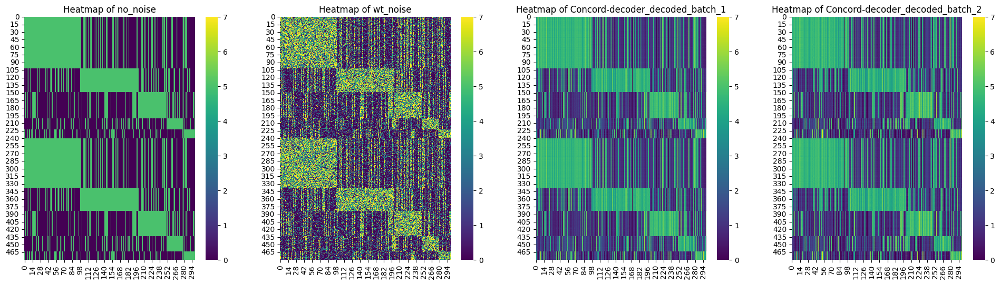

In [ ]:
# Align and copy the layer data based on observation names
decoded_layers = [f'Concord-decoder_decoded_{batch}' for batch in decoder_domains]
for key in decoded_layers:
    adata_state.layers[key] = adata[adata_state.obs_names, adata_state.var_names].layers[key].copy()

# Compute the reconstruction error between the original and reconstructed data

show_layers = ['no_noise', 'wt_noise'] + decoded_layers
ccd.pl.plot_adata_layer_heatmaps(adata_state, ncells=None, ngenes=None, layers=show_layers, cmap='viridis', vmin=0, vmax=7, 
                                 obs_keys=[state_key, batch_key], transpose=False, figsize=(6,6),  dpi=300, save_path=save_dir/f'decoded_heatmap_{file_suffix}.png')

In [237]:
# Compute the reconstruction error between the original and reconstructed data
mse_no_noise = np.zeros(len(decoded_layers))
mse_wt_noise = np.zeros(len(decoded_layers))
for layer in decoded_layers:
    mse_no_noise[decoded_layers.index(layer)] = ccd.ul.compute_reconstruction_error(adata_state, 'no_noise', layer, metric='mse')
    mse_wt_noise[decoded_layers.index(layer)] = ccd.ul.compute_reconstruction_error(adata_state, 'wt_noise', layer, metric='mse')

# Report value, mean
print(f"MSE between no_noise and decoded layers: {mse_no_noise}")
print(f"MSE between wt_noise and decoded layers: {mse_wt_noise}")
print(f"Mean MSE between no_noise and decoded layers: {np.mean(mse_no_noise):.4f}")
print(f"Mean MSE between wt_noise and decoded layers: {np.mean(mse_wt_noise):.4f}")


MSE between no_noise and decoded layers: [0.7530231  0.72055411]
MSE between wt_noise and decoded layers: [5.06856414 5.07892395]
Mean MSE between no_noise and decoded layers: 0.7368
Mean MSE between wt_noise and decoded layers: 5.0737


### 2.1 Pairwise distance

In [11]:
# Compute distance matrices for all keys
dist_metric = 'cosine'
distance_result = ccd.ul.pairwise_distance(adata, keys = combined_keys, metric=dist_metric)
groundtruth_key = 'PCA_no_noise'
corr_types = ['pearsonr', 'spearmanr', 'kendalltau']
corr_result = ccd.ul.distance_correlation(distance_result, corr_types=corr_types, groundtruth_key=groundtruth_key)
corr_result.to_csv(save_dir / f"distance_correlation_{file_suffix}.csv")
corr_result

,pearsonr,spearmanr,kendalltau
Unintegrated,0.792894,0.744836,0.567895
Scanorama,0.948464,0.914897,0.759252
Liger,0.729178,0.558997,0.396384
Harmony,0.943631,0.911567,0.756555
scVI,0.498222,0.430151,0.308916
scANVI,0.724897,0.634585,0.465917
Concord,0.962084,0.947016,0.816160
Concord-decoder,0.964091,0.960261,0.844309
Concord-class,0.950616,0.942025,0.807967
PCA_no_noise,1.000000,1.000000,1.000000


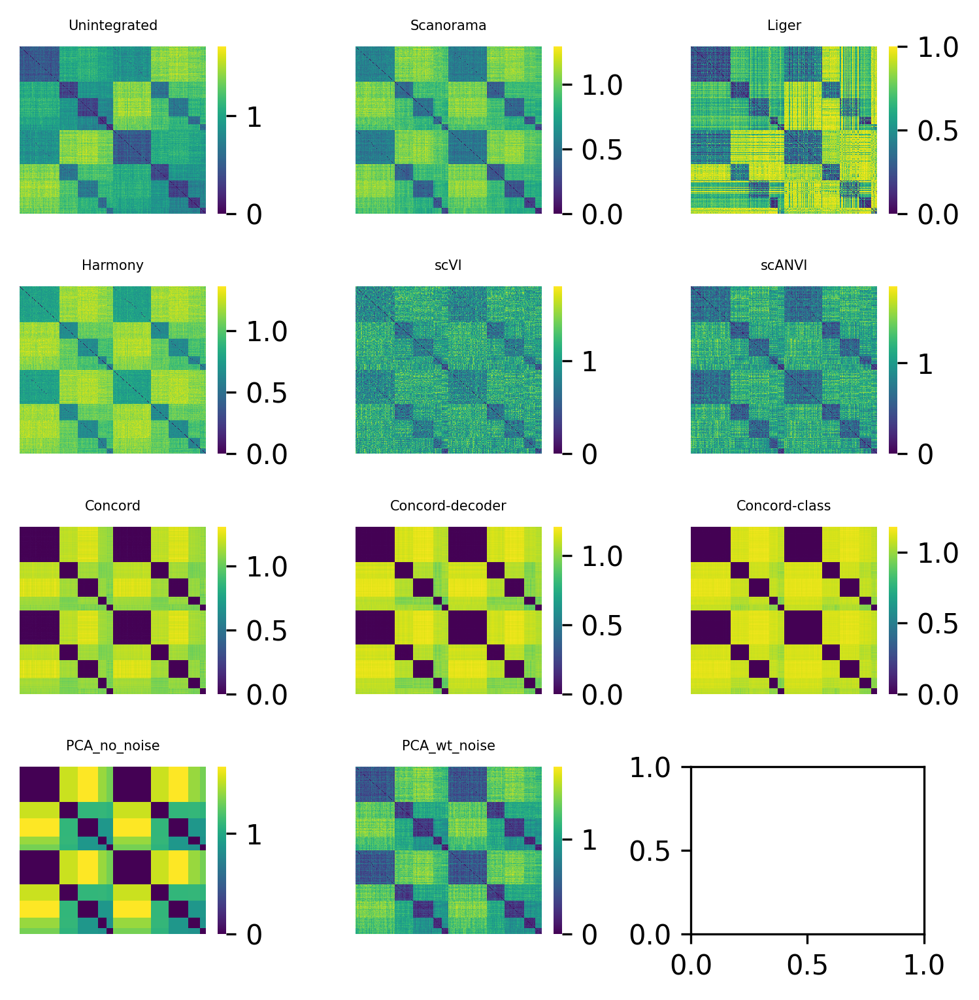

In [ ]:
# Visualize the distance matrices
# Plot the persistence diagrams into a single figure
from scipy.spatial.distance import squareform
import matplotlib.pyplot as plt
import seaborn as sns
n_plots = len(combined_keys)
n_cols = 3
n_rows = int(np.ceil(n_plots / n_cols))
base_height = 1.3
base_width = 1.7
fig, axes = plt.subplots(n_rows, n_cols, figsize=(base_width * n_cols, base_height * n_rows), dpi=300)
for i, key in enumerate(combined_keys):
    ax = axes[i // n_cols, i % n_cols]
    sns.heatmap(squareform(distance_result[key]), ax=ax, cmap='viridis', xticklabels=False, yticklabels=False)
    ax.set_title(key, fontsize=5)

# Save the plot
fig.tight_layout()
fig.savefig(save_dir / f"{dist_metric}_distance_matrix_{file_suffix}.png", dpi=300)
plt.show()

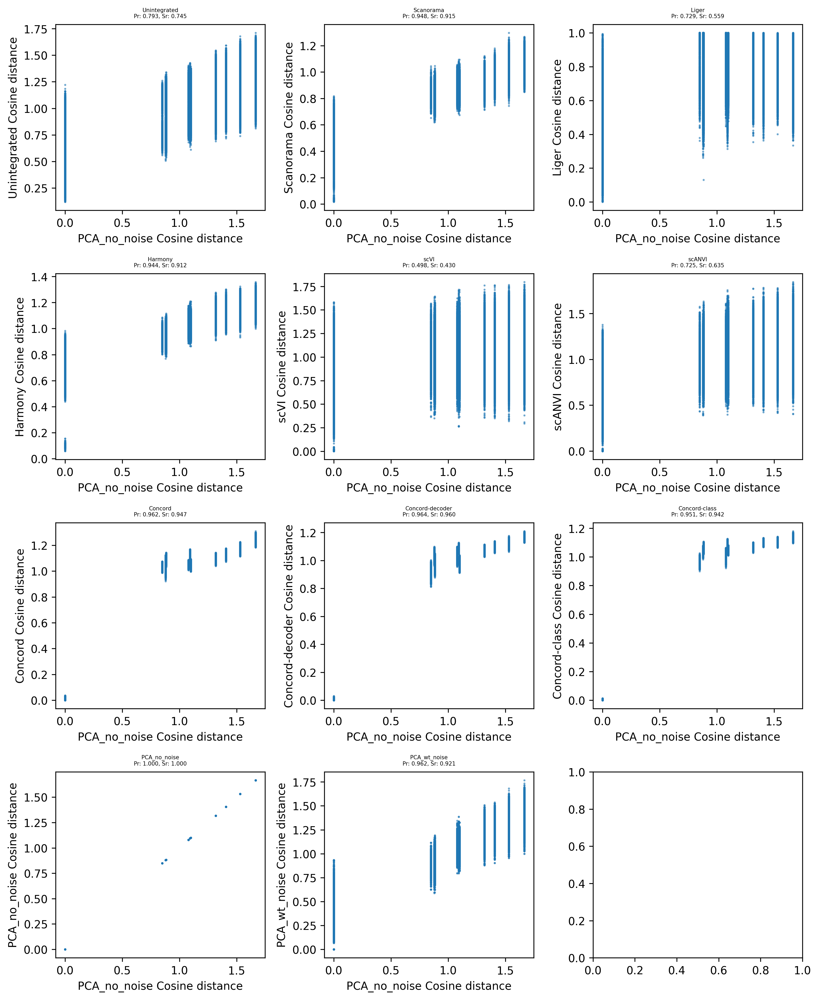

In [27]:
# visualize the correlation between pairwise distances in original and latent space
n_cols = 3
n_rows = int(np.ceil(n_plots / n_cols))
base_height = 3.2
base_width = 3.5
fig, axes = plt.subplots(n_rows, n_cols, figsize=(base_width * n_cols, base_height * n_rows), dpi=300)
for i, key in enumerate(combined_keys):
    ax = axes[i // n_cols, i % n_cols]
    ax.scatter(distance_result['PCA_no_noise'], distance_result[key], s=1, alpha=0.5)
    ax.set_title(f'{key}\nPr: {pr_result[key][0]:.3f}, Sr: {sr_result[key][0]:.3f}', fontsize=5)
    ax.set_xlabel(f'PCA_no_noise {dist_metric.capitalize()} distance')
    ax.set_ylabel(f'{key} {dist_metric.capitalize()} distance')

plt.tight_layout()
plt.savefig(save_dir / f"{dist_metric}_distance_correlation_{file_suffix}.png", dpi=300)

In [76]:
import pandas as pd
local_spearman = {}
distal_spearman = {}
corr_method = 'spearman'
for key in combined_keys:
    local_spearman[key], distal_spearman[key] = ccd.ul.local_vs_distal_corr(adata.obsm[groundtruth_key], adata.obsm[key], method=corr_method)

local_spearman_df = pd.DataFrame(local_spearman, index = [f'Local {corr_method} correlation']).T
distal_spearman_df = pd.DataFrame(distal_spearman, index = [f'Distal {corr_method} correlation']).T
local_distal_corr_df = pd.concat([local_spearman_df, distal_spearman_df], axis=1)
local_distal_corr_df

,Local spearman correlation,Distal spearman correlation
Unintegrated,0.098847,0.036639
Scanorama,0.131420,-0.044093
Liger,-0.103691,0.074729
Harmony,0.127570,0.053603
scVI,-0.005280,-0.014883
scANVI,0.000097,-0.018669
Concord,0.111750,-0.109238
Concord-decoder,0.001045,-0.147300
Concord-class,0.039604,-0.042638
PCA_no_noise,1.000000,1.000000


## Trustworthiness analysis

In [ ]:
# Plot trustworthiness as a function of number of neighbors for all latents
# Not going to work here because the ranking for adata_state.obsm['PCA_no_noise'] is not exact due to same values
import numpy as np
import matplotlib.pyplot as plt
from sklearn.manifold import trustworthiness
max_nb = adata_state.n_obs // 2
n_neighbors = np.arange(10, max_nb, 10)
trust_results = {}

for key in combined_keys:
    trust_results[key] = [trustworthiness(adata_state.obsm['PCA_wt_noise'], adata_state.obsm[key], n_neighbors=n) for n in n_neighbors]

# Convert the results to a DataFrame 
import pandas as pd
trust_df = pd.DataFrame(trust_results, index=n_neighbors)
trust_df.to_csv(save_dir / f"trustworthiness_{file_suffix}.csv")
trust_df

key:  Unintegrated
key:  Scanorama
key:  Liger
key:  Harmony
key:  scVI
key:  scANVI
key:  Concord
key:  Concord-decoder
key:  Concord-class
key:  PCA_no_noise
key:  PCA_wt_noise


,Unintegrated,Scanorama,Liger,Harmony,scVI,scANVI,Concord,Concord-decoder,Concord-class,PCA_no_noise,PCA_wt_noise
10,0.978624,0.962278,0.934046,0.961686,0.914222,0.935525,0.900632,0.897083,0.892764,0.855396,0.999990
20,0.974608,0.962119,0.933163,0.961093,0.891997,0.940127,0.908786,0.908710,0.904480,0.890271,0.999995
30,0.972256,0.964255,0.934592,0.963617,0.877202,0.939446,0.919069,0.919482,0.916238,0.911090,0.999995
40,0.969673,0.966335,0.936549,0.966305,0.863206,0.934784,0.920247,0.927896,0.924218,0.918590,0.999996
50,0.968322,0.968331,0.935884,0.969355,0.849050,0.930787,0.924647,0.935249,0.931755,0.925572,0.999995
60,0.969801,0.969264,0.935123,0.971694,0.837216,0.924953,0.918563,0.939980,0.936747,0.931205,0.999996
70,0.969439,0.969777,0.932997,0.974296,0.825492,0.917762,0.917519,0.943787,0.941100,0.935479,0.999996
80,0.967140,0.970325,0.927774,0.976734,0.815359,0.908573,0.916375,0.947457,0.945177,0.940631,0.999997
90,0.963813,0.970801,0.919027,0.978964,0.807236,0.899814,0.915307,0.948248,0.945716,0.946817,0.999996
100,0.962206,0.969165,0.909471,0.980130,0.800085,0.890718,0.909806,0.943231,0.942768,0.946388,0.999996


In [102]:
n_neighbors = np.arange(10, 101, 10)
trustworthiness_scores, trustworthiness_stats = ccd.ul.compute_trustworthiness(adata, embedding_keys = combined_keys, groundtruth='PCA_wt_noise', metric='euclidean', n_neighbors=n_neighbors)
trustworthiness_scores

,Embedding,n_neighbors,Trustworthiness
0,Unintegrated,10,0.978624
1,Unintegrated,20,0.974608
2,Unintegrated,30,0.972256
3,Unintegrated,40,0.969673
4,Unintegrated,50,0.968322
...,...,...,...
105,PCA_wt_noise,60,0.999996
106,PCA_wt_noise,70,0.999996
107,PCA_wt_noise,80,0.999997
108,PCA_wt_noise,90,0.999996


In [ ]:
trustworthiness_stats

,Embedding,Average Trustworthiness,Decay Rate
0,Unintegrated,0.969588,-1.503880e-04
1,Scanorama,0.967265,9.961651e-05
2,Liger,0.929863,-2.215981e-04
3,Harmony,0.970387,2.321180e-04
4,scVI,0.848107,-1.245303e-03
5,scANVI,0.922249,-5.434640e-04
6,Concord,0.915095,6.089037e-05
7,Concord-decoder,0.931112,5.359866e-04
8,Concord-class,0.928096,5.691069e-04
9,PCA_no_noise,0.920144,8.598531e-04


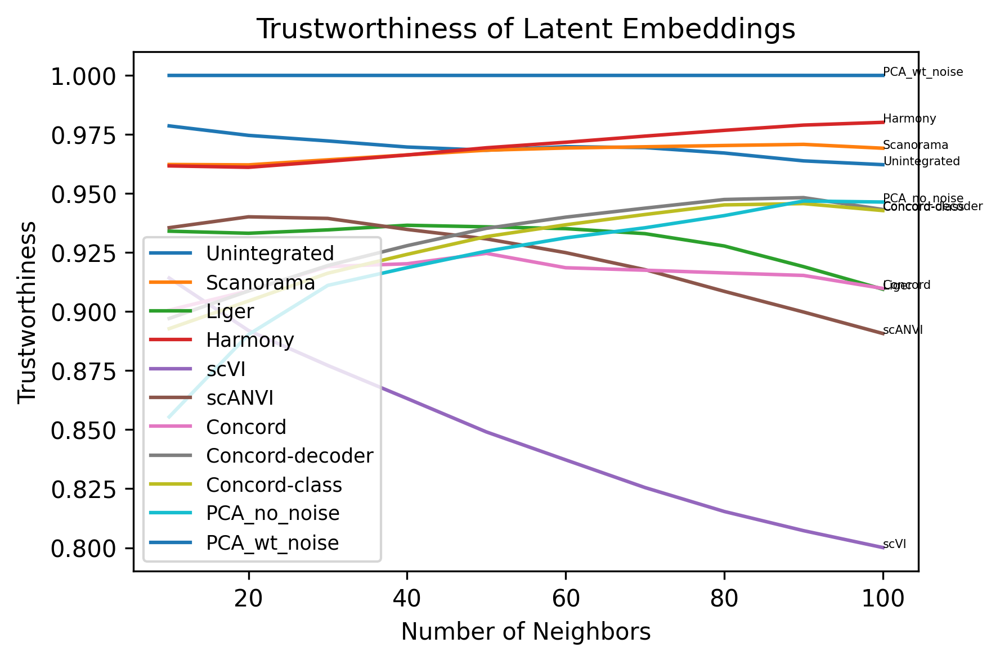

In [107]:
ccd.pl.plot_trustworthiness(trustworthiness_scores, save_path=save_dir / f"trustworthiness_{file_suffix}.png")

### Show preservation of distance at cluster level

In [ ]:
import pandas as pd
from scipy.spatial.distance import pdist
from scipy.spatial.distance import squareform


dist_metric = 'cosine'
# Define function to compute centroid distances


# Compute centroid distances for each latent
cluster_centroid_distances = {}
for key in combined_keys:
    cluster_centroid_distances[key] = ccd.ul.compute_centroid_distance(adata_state, key, group_key)

# Compute correlation between pairwise distances in original and latent space
corr_cluster_result = ccd.ul.distance_correlation(cluster_centroid_distances, corr_types=corr_types, groundtruth_key=groundtruth_key)
corr_cluster_result.to_csv(save_dir / f"cluster_centroid_correlation_{file_suffix}.csv")
corr_cluster_result

,pearsonr,spearmanr,kendalltau
Unintegrated,0.999476,0.963636,0.911111
Scanorama,0.979589,0.951515,0.866667
Liger,0.266462,0.139394,0.066667
Harmony,0.999469,0.963636,0.911111
scVI,0.933408,0.951515,0.822222
scANVI,0.951824,0.975758,0.911111
Concord,0.855755,0.842424,0.733333
Concord-decoder,0.895654,0.866667,0.777778
Concord-class,0.779861,0.890909,0.777778
PCA_no_noise,1.000000,1.000000,1.000000


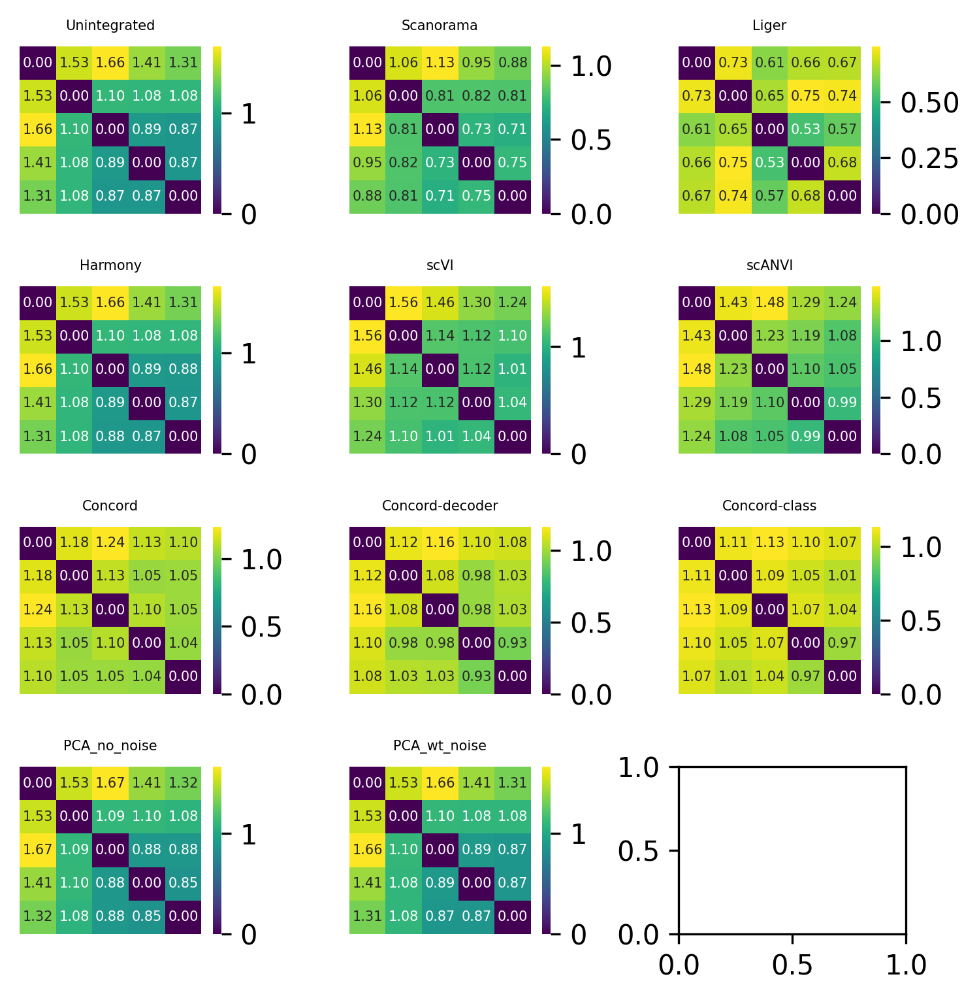

In [35]:
import matplotlib.pyplot as plt
import seaborn as sns
combined_keys = list(distance_result.keys())
n_plots = len(combined_keys)
n_cols = 3
n_rows = int(np.ceil(n_plots / n_cols))
base_height = 1.3
base_width = 1.7
fig, axes = plt.subplots(n_rows, n_cols, figsize=(base_width * n_cols, base_height * n_rows), dpi=300)
for i, key in enumerate(combined_keys):
    ax = axes[i // n_cols, i % n_cols]
    sns.heatmap(squareform(cluster_centroid_distances[key]), ax=ax, cmap='viridis', xticklabels=False, yticklabels=False, annot=True, fmt=".2f", annot_kws={"size": 5})
    ax.set_title(key, fontsize=5)

# Save the plot
fig.tight_layout()
fig.savefig(save_dir / f"cluster_centroid_distance_{file_suffix}.png", dpi=300)
plt.show()


In [86]:
corr_cluster_result.loc['Concord'][0]

0.8557551456968883

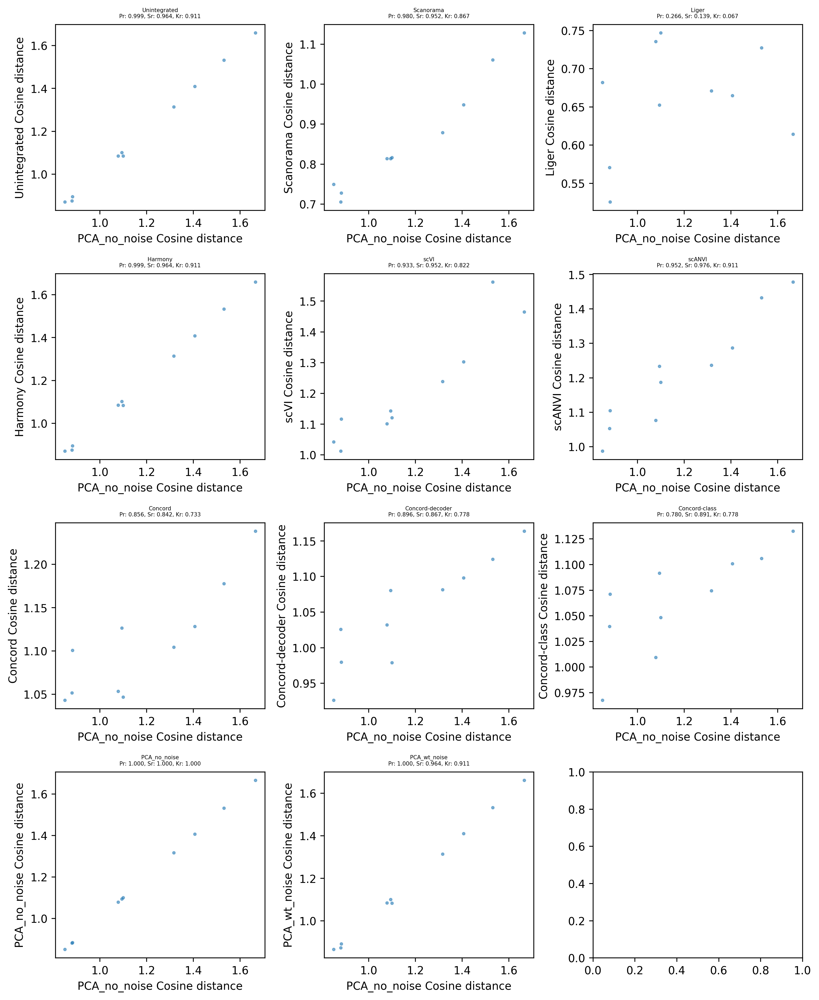

In [87]:
# and visualize the correlation between pairwise distances in original and latent space
n_cols = 3
n_rows = int(np.ceil(n_plots / n_cols))
base_height = 3.2
base_width = 3.5
fig, axes = plt.subplots(n_rows, n_cols, figsize=(base_width * n_cols, base_height * n_rows), dpi=300)
for i, key in enumerate(combined_keys):
    ax = axes[i // n_cols, i % n_cols]
    ax.scatter(cluster_centroid_distances['PCA_no_noise'], cluster_centroid_distances[key], s=5, alpha=0.5)
    ax.set_title(f'{key}\nPr: {corr_cluster_result.loc[key][0]:.3f}, Sr: {corr_cluster_result.loc[key][1]:.3f}, Kr: {corr_cluster_result.loc[key][2]:.3f}', fontsize=5)
    ax.set_xlabel(f'PCA_no_noise {dist_metric.capitalize()} distance')
    ax.set_ylabel(f'{key} {dist_metric.capitalize()} distance')

plt.tight_layout()
plt.savefig(save_dir / f"cluster_{dist_metric}_distance_correlation_{file_suffix}.png", dpi=300)

### Batch to state distance ratio

In [ ]:
# Compute the Batch-to-State Distance Ratio for all latent embeddings
batch_state_distance_ratios = {}
for key in latent_keys:
    batch_state_distance_ratios[key] = ccd.ul.compute_batch_state_distance_ratio(adata, latent_key=key, batch_key=batch_key, state_key=state_key, metric='cosine')

# Convert the results to a DataFrame
batch_state_distance_ratio_df = pd.DataFrame(batch_state_distance_ratios, index=[f'Batch-State Distance Ratio']).T
batch_state_distance_ratio_df.to_csv(save_dir / f"batch_state_distance_ratio_{file_suffix}.csv")
batch_state_distance_ratio_df

,Batch-State Distance Ratio
Unintegrated,0.446439
Scanorama,0.001427
Liger,0.193232
Harmony,0.003187
scVI,0.023509
scANVI,0.010672
Concord,0.000516
Concord-decoder,0.002604
Concord-class,0.001322


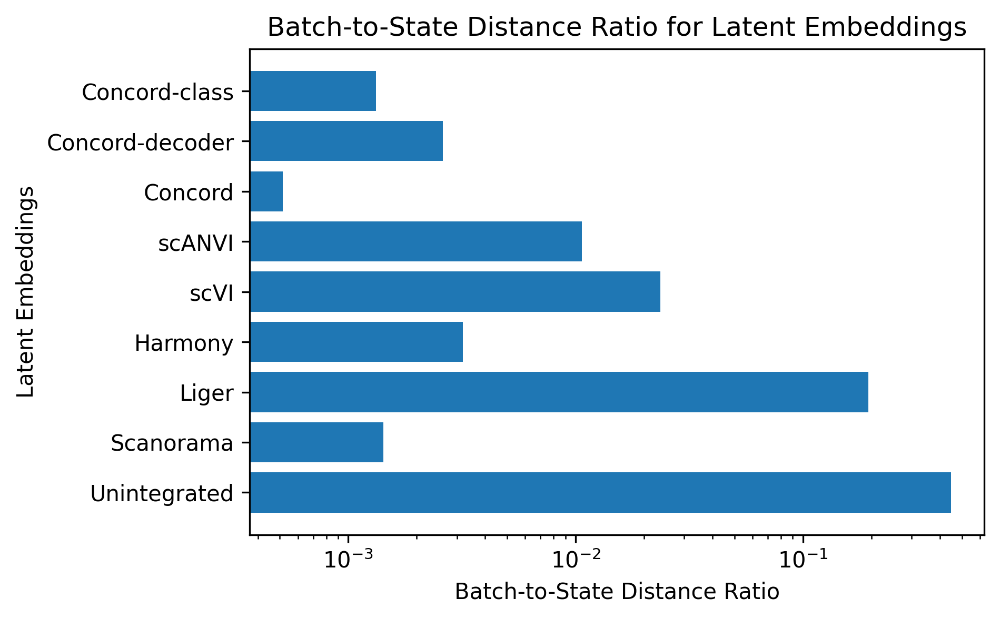

In [39]:
# Visualize the Batch-to-State Distance Ratio for all latent embeddings with log scale
import matplotlib.pyplot as plt

plt.figure(figsize=(6,4), dpi=300)
plt.barh(list(batch_state_distance_ratios.keys()), list(batch_state_distance_ratios.values()))
plt.xscale('log')
plt.xlabel('Batch-to-State Distance Ratio')
plt.ylabel('Latent Embeddings')
plt.title('Batch-to-State Distance Ratio for Latent Embeddings')
plt.savefig(save_dir / f"batch_state_distance_ratio_{file_suffix}.png")
plt.show()
